In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from tabulate import tabulate
import missingno as msno
from IPython.display import display_html
from PIL import Image
import gc
import cv2
from scipy.stats import pearsonr

Here we are importing necessary libraries like pandas,numpy, saborn etc.
* **pandas:** Data manipulation and analysis tool, particularly suited for handling structured data (e.g., tables, spreadsheets).
* **numpy:** Numerical computing library providing support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.
* **seaborn:** Statistical data visualization library based on matplotlib, offering high-level abstractions to create attractive and informative statistical graphics.
* **matplotlib.pyplot:** Plotting library for creating static, animated, and interactive visualizations in Python.
* **%matplotlib inline:** IPython magic command to display matplotlib plots inline within Jupyter notebooks.
* **matplotlib.image:** Module within matplotlib for loading, displaying, and manipulating image data.

* **cv2:** OpenCV (Open Source Computer Vision Library) for computer vision and image processing tasks like object detection, recognition, and tracking.
* **scipy.stats.pearsonr:** Function from SciPy's statistics module for calculating the Pearson correlation coefficient and its associated p-value for two arrays.

In [2]:
from skimage.transform import resize
import copy
import re


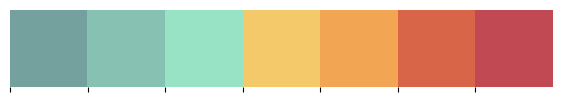

In [3]:
# Segmentation
import scipy.ndimage
from skimage import morphology
from skimage import measure
from skimage.transform import resize
from sklearn.cluster import KMeans
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.tools import FigureFactory as FF
from plotly.graph_objs import *
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")


# Set Color Palettes for the notebook
custom_colors = ['#74a09e','#86c1b2','#98e2c6','#f3c969','#f2a553', '#d96548', '#c14953']
sns.palplot(sns.color_palette(custom_colors))

# The despine() is a function that removes the spines from the right and upper portion of the plot by default.
sns.set_style("whitegrid")
sns.despine(left=True, bottom=True)

> *The above code customizes the color palette for visualizations and adjusts the plot style by setting it to "whitegrid" while removing the spines from the left and bottom sides of the plots for a cleaner and more visually appealing presentation of data.*

> The code below infers reading train and test data getting total readings in train data i.e., **1549 ** patient readings

In [4]:
# Import train + test data
train = pd.read_csv("../input/osic-pulmonary-fibrosis-progression/train.csv")
test = pd.read_csv("../input/osic-pulmonary-fibrosis-progression/test.csv")

# Train len
print("Total Recordings in Train Data: {:,}".format(len(train)))

Total Recordings in Train Data: 1,549


* In the code below we are getting head and tail of train data.

In [5]:

df1_styler = train.head().style.set_table_attributes("style='display:inline'").set_caption('Head Train Data')
df2_styler = test.style.set_table_attributes("style='display:inline'").set_caption('Test Data (rest Hidden)')

display_html(df1_styler._repr_html_() + df2_styler._repr_html_(), raw=True)

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker
,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker
1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker
2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker
3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker


* From this we get to know what are the attributes present in this dataset.
* The attributes are given by patient, weeks, FVC, Percent, Age, Sex, Smoking status.
* From this the most useful attrbutes for this project are Age,Sex,Smoking status,Patient.

In [6]:
#checking missing values
print(format(train.isnull().values.any()))

False


> This code snippet allows us to check for any missing values in the dataset. Intially there are no missing values found.

# EXPLORATORY DATA ANALYSIS

The provided code is used to perform data analysis and visualization on a dataset. It starts by grouping the data by patient and selecting the unique values for age, sex, and smoking status. The resulting DataFrame is then used to create subplots for different types of plots.

* Patient Age Distribution: A box plot is created to show the distribution of patient ages. The box plot displays the median, quartiles, and outliers of the age data, providing insights into the spread and skewness of the data.

* Sex Frequency: A pie chart is used to visualize the frequency of different sexes in the dataset. The pie chart shows the proportion of each sex, allowing for a quick comparison of the distribution of sexes.

* Smoking Status: A bar plot is created to show the distribution of smoking statuses. The bar plot displays the count of patients with each smoking status, helping to identify the most common and least common smoking statuses in the dataset.

The code uses several libraries, including pandas, seaborn, and matplotlib, to perform the data analysis and visualization tasks. The seaborn library is used to create the box plot, pie chart, and bar plot, while pandas is used for data manipulation and grouping. Matplotlib is used to create the subplots and customize the appearance of the plots.

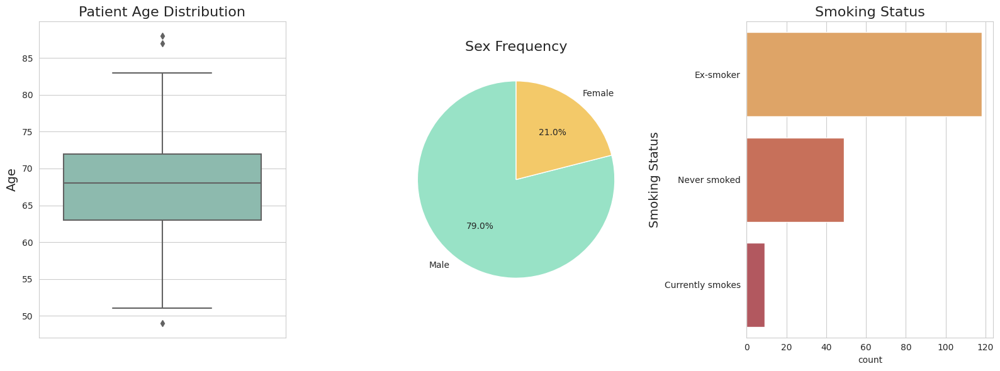

In [7]:
# Select unique bio info for the patients like age, sex, smoking status
data = train.groupby(by="Patient")[["Patient", "Age", "Sex", "SmokingStatus"]].first().reset_index(drop=True)

# Create subplots for different plot types
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Plot for Patient Age Distribution using a Box Plot
sns.boxplot(y=data["Age"], ax=ax1, color=custom_colors[1])
ax1.set_title("Patient Age Distribution", fontsize=16)
ax1.set_ylabel("Age", fontsize=14)

# Plot for Sex Frequency using a Pie Chart
sex_counts = data["Sex"].value_counts()
ax2.pie(sex_counts, labels=sex_counts.index, colors=custom_colors[2:4], autopct='%1.1f%%', startangle=90)
ax2.set_title("Sex Frequency", fontsize=16)

# Plot for Smoking Status using a Bar Plot
sns.countplot(y=data["SmokingStatus"], ax=ax3, palette=custom_colors[4:7])
ax3.set_title("Smoking Status", fontsize=16)
ax3.set_ylabel("Smoking Status", fontsize=14)

plt.tight_layout()
plt.show()

* The above code we infer that our attributes age, sex and smoking status into various graphs to understand the data.
* The patient age is given by a box plot which clearly says that ost patients are in between 60-75 age group.
* And teh pie chart for sex infers that there are more male patients than female patients with ratio od arund 7.9:2.1 i.e., for every 100 patient 7 patients are male and 21 are female.
* Fror smoking status we used bar chart to visualize data. Here we get to knw that people who never smoked and pelple wh stopped smoking are more likely to get this disease.
* Current smokers are less likely to get pulmonary fibrosis.

> **FVC rate**
FVC stands for Forced Vital Capacity. It's a common measure used in pulmonary function tests (PFTs) to assess lung function.

The code provided is used to analyze and visualize the distribution of two variables, "FVC" and "Percent," in a dataset. It consists of two main parts:

* Printing the minimum and maximum values: The first part of the code prints the minimum and maximum values for both variables using the min() and max() functions on the "FVC" and "Percent" columns of the dataset.

* Creating swarm plots: The second part of the code uses Seaborn's swarmplot() function to create swarm plots for the "FVC" and "Percent" variables. Swarm plots are a type of scatter plot where one variable is categorical, and the points are adjusted to not overlap. This provides a better representation of the distribution of values, especially when the number of observations is not too large

Min FVC value: 827 
Max FVC value: 6,399 

Min Percent value: 28.88% 
Max Percent value: 153.1%


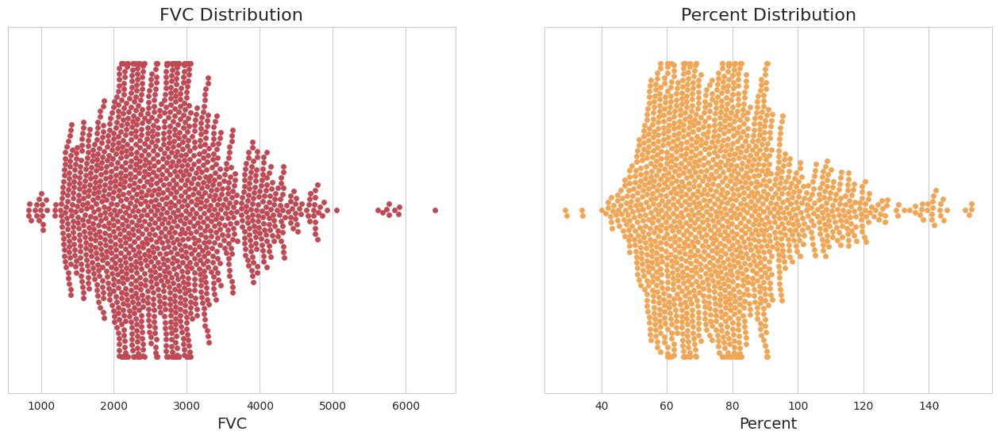

In [8]:
print("Min FVC value: {:,}".format(train["FVC"].min()), "\n" +
      "Max FVC value: {:,}".format(train["FVC"].max()), "\n" +
      "\n" +
      "Min Percent value: {:.4}%".format(train["Percent"].min()), "\n" +
      "Max Percent value: {:.4}%".format(train["Percent"].max()))



# Create subplots for Swarm Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Swarm Plot for FVC
sns.swarmplot(x=train["FVC"], ax=ax1, color=custom_colors[6])
ax1.set_title("FVC Distribution", fontsize=16)
ax1.set_xlabel("FVC", fontsize=14)

# Swarm Plot for Percent
sns.swarmplot(x=train["Percent"], ax=ax2, color=custom_colors[4])
ax2.set_title("Percent Distribution", fontsize=16)
ax2.set_xlabel("Percent", fontsize=14)

plt.show()

> * FVC represents the total amount of air a person can forcibly exhale after taking a deep breath. 
> * During the test, the individual inhales deeply and then exhales as forcefully and completely as possible into a spirometer, a device that measures lung volume and airflow.
> 
> * FVC is a key indicator of lung health and is often used to diagnose and monitor various respiratory conditions such as asthma, chronic obstructive pulmonary disease (COPD), and restrictive lung diseases.
> * Abnormalities in FVC values can indicate lung disorders, impaired lung function, or the presence of respiratory issues. 
> * FVC results are often compared to predicted values based on factors such as age, height, sex, and ethnicity to evaluate lung function relative to expected norms.

* From the above code displays the minimum and maximum values of the 'FVC' (Forced Vital Capacity) and 'Percent' columns from the 'train' dataset.
* The minium and maximum values got by the code are as follows Minimum FVC value: 827 
  Maximum FVC value: 6,399.
* The percentage of min and max value is given by Min Percent value: 28.88% 
   Max Percent value: 153.1%



* This code is used to analyze the distribution of patient entries across different weeks. It starts by grouping the data by patient and counting the number of entries for each patient using the groupby() and count() functions. The resulting DataFrame is then sorted by the number of entries in descending order.
* The code then calculates the minimum and maximum number of entries for all patients using the min() and max() functions on the "Weeks" column.
* Next, a line plot is created using Seaborn's lineplot() function. The plot shows the number of entries for each patient, with the x-axis representing the patient number and the y-axis representing the number of entries. The plot is customized with a title and labels for the x- and y-axes.
* Finally, the x-axis of the plot is hidden using p.axes.get_xaxis().set_visible(False) to focus on the distribution of entries across patients.
* In summary, this code is used to visualize the distribution of patient entries across different weeks, providing insights into the frequency of patient entries.
* 

There are 176 unique patients in Train Data. 

Minimum number of entries are: 6 
Maximum number of entries are: 10


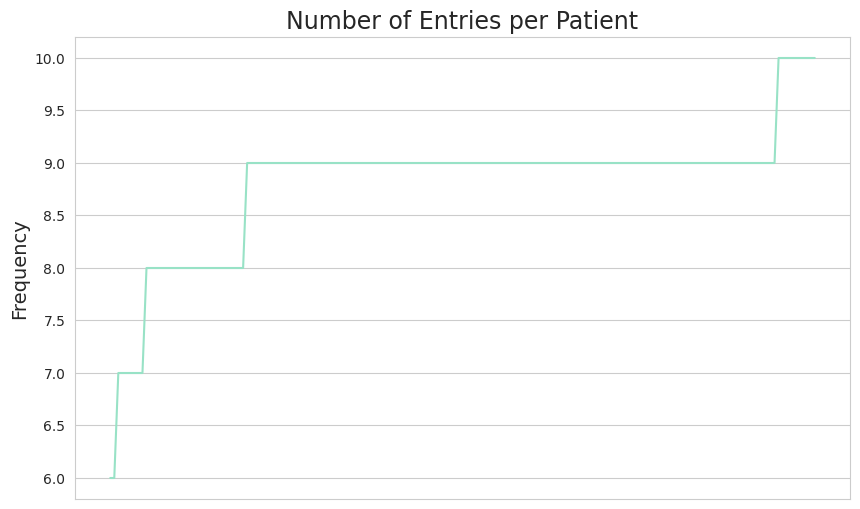

In [9]:
print("There are {} unique patients in Train Data.".format(len(train["Patient"].unique())), "\n")

# Recordings per Patient
data = train.groupby(by="Patient")["Weeks"].count().reset_index(drop=False)
# Sort by Weeks
data = data.sort_values(['Weeks']).reset_index(drop=True)
print("Minimum number of entries are: {}".format(data["Weeks"].min()), "\n" +
      "Maximum number of entries are: {}".format(data["Weeks"].max()))




plt.figure(figsize=(10, 6))
p = sns.lineplot(x=data["Patient"], y=data["Weeks"], color=custom_colors[2 % len(custom_colors)])

plt.title("Number of Entries per Patient", fontsize=17)
plt.xlabel('Patient', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

p.axes.get_xaxis().set_visible(False)
plt.show()


* The code provided is used for data analysis, specifically for exploring the distribution of patient information, including age, sex, and smoking status. The code can be broken down into the following steps:
* Data selection: The code selects unique patient information, such as age, sex, and smoking status, from the dataset. This is done using the groupby() function in pandas, which groups the data by patient and then selects the first row of each group using the first() function. The resulting DataFrame is stored in the variable data.
* Subplots creation: The code creates subplots for different plot types using Seaborn's subplots() function. The subplots are arranged in a single row with three columns, each representing a different plot type.
* Violin plot for patient age distribution: A violin plot is created to visualize the distribution of patient ages. The violin plot shows the distribution of ages across different patients, with the x-axis representing the age and the y-axis representing the number of patients. The plot is customized with a title and labels for the x- and y-axes.
* Pie chart for sex frequency: A pie chart is used to visualize the frequency of different sexes in the dataset. The pie chart shows the proportion of each sex, allowing for a quick comparison of the distribution of sexes.
* Swarm plot for smoking status: A swarm plot is created to show the distribution of smoking statuses. The swarm plot displays the count of patients with each smoking status, helping to identify the most common and least common smoking statuses in the dataset.
* The code uses several libraries, including pandas, Seaborn, and Matplotlib, to perform the data analysis and visualization tasks. The Seaborn library is used to create the violin plot, pie chart, and swarm plot, while pandas is used for data manipulation and grouping. Matplotlib is used to create the subplots and customize the appearance of the plots.
* In summary, the code is used to analyze and visualize the distribution of patient information, such as age, sex, and smoking status, in a dataset. The subplots are used to show different aspects of the data distribution, providing insights into the data.

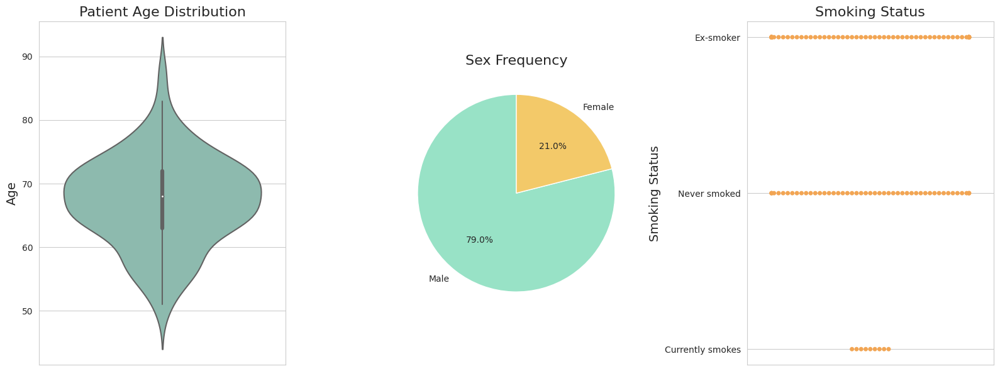

In [10]:
# Select unique bio info for the patients
data = train.groupby(by="Patient")[["Patient", "Age", "Sex", "SmokingStatus"]].first().reset_index(drop=True)

# Create subplots with different plot types for enhanced representation
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Plot for Patient Age Distribution using a Violin Plot
sns.violinplot(y=data["Age"], ax=ax1, color=custom_colors[1])
ax1.set_title("Patient Age Distribution", fontsize=16)
ax1.set_ylabel("Age", fontsize=14)

# Plot for Sex Frequency using a Pie Chart
sex_counts = data["Sex"].value_counts()
ax2.pie(sex_counts, labels=sex_counts.index, colors=custom_colors[2:4], autopct='%1.1f%%', startangle=90)
ax2.set_title("Sex Frequency", fontsize=16)

# Plot for Smoking Status using a Swarm Plot
sns.swarmplot(y=data["SmokingStatus"], ax=ax3, palette=custom_colors[4:7])
ax3.set_title("Smoking Status", fontsize=16)
ax3.set_ylabel("Smoking Status", fontsize=14)

plt.tight_layout()
plt.show()

* Printing Min and Max Values:
    * The code prints the minimum and maximum values for FVC and Percent columns in the dataset using the min() and max() functions. This provides an overview of the range of values for these variables.
* Creating Subplots:
    * Two subplots are created side by side using plt.subplots() to accommodate different plot types for FVC and Percent distributions.
* Box Plot for FVC Distribution:
    * A box plot is used to visualize the distribution of FVC values. The box plot displays the median, quartiles, and potential outliers in the FVC data, offering insights into the spread and central tendency of the FVC values.
* Violin Plot for Percent Distribution:
    * A violin plot is employed to show the distribution of Percent values. The violin plot provides a visual representation of the distribution's shape, spread, and central tendency for the Percent variable.
* Plot Customization:
    * Each plot is customized with titles, y-axis labels, and appropriate colors to enhance readability and interpretation.
    * plt.tight_layout() is used to adjust the layout for better spacing between the subplots.

Min FVC value: 827 
Max FVC value: 6,399 

Min Percent value: 28.88% 
Max Percent value: 153.1%


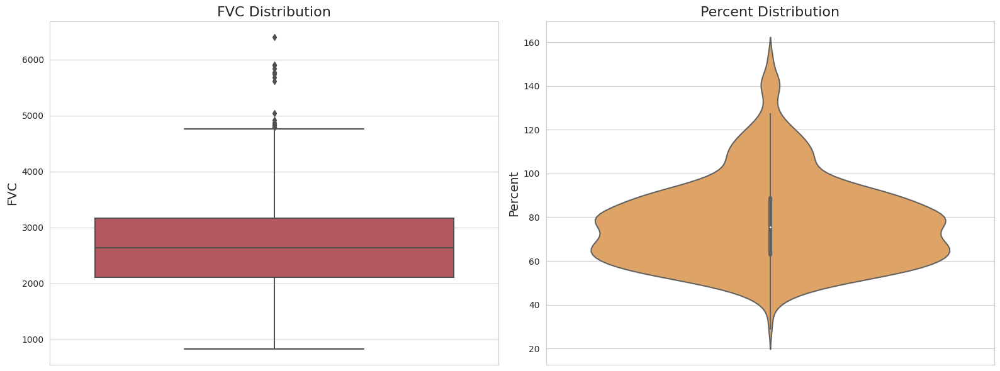

In [11]:

# Print Min and Max values for FVC and Percent
print("Min FVC value: {:,}".format(train["FVC"].min()), "\n" +
      "Max FVC value: {:,}".format(train["FVC"].max()), "\n" +
      "\n" +
      "Min Percent value: {:.4}%".format(train["Percent"].min()), "\n" +
      "Max Percent value: {:.4}%".format(train["Percent"].max()))

# Create subplots with different plot types for enhanced representation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot for FVC Distribution using a Box Plot
sns.boxplot(y=train["FVC"], ax=ax1, color=custom_colors[6])
ax1.set_title("FVC Distribution", fontsize=16)
ax1.set_ylabel("FVC", fontsize=14)

# Plot for Percent Distribution using a Violin Plot
sns.violinplot(y=train["Percent"], ax=ax2, color=custom_colors[4])
ax2.set_title("Percent Distribution", fontsize=16)
ax2.set_ylabel("Percent", fontsize=14)

plt.tight_layout()
plt.show()

The provided sources discuss topics related to coding, specifically seaborn.histplot, and the usage of histograms in data visualization. Source and detail the functionality of seaborn.histplot, which allows for the creation of univariate or bivariate histograms to represent the distribution of variables. It provides options for customizing the appearance of histograms, such as log scaling, different bar styles, and cumulative histograms. Additionally, it can handle categorical variables and hue semantics for more complex visualizations. On the other hand, source explains the difference between coding and programming, highlighting that coding involves writing code to fulfill specific user stories, while programming encompasses broader considerations like scalability and security.
In summary, seaborn.histplot is a versatile tool for creating histograms in Python, offering various customization options for data visualization, while coding involves the practical implementation of code to achieve specific functionalities within a program or system

Minimum no. weeks before CT: -5 
Maximum no. weeks after CT: 133


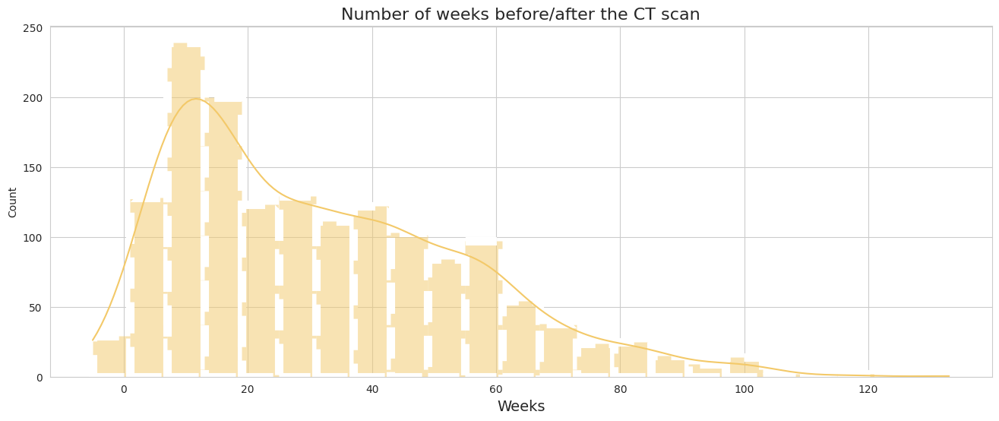

In [12]:
# Print Min and Max values for Weeks
print("Minimum no. weeks before CT: {}".format(train['Weeks'].min()), "\n" +
      "Maximum no. weeks after CT: {}".format(train['Weeks'].max()))

# Create a figure for the plot
plt.figure(figsize=(16, 6))

# Plot for Number of Weeks using a Histogram
sns.histplot(train['Weeks'], color=custom_colors[3], kde=True, linewidth=8, linestyle="--")
plt.title("Number of weeks before/after the CT scan", fontsize=16)
plt.xlabel("Weeks", fontsize=14)

plt.show()

* Correlation Computation: The code calculates Pearson correlation coefficients between pairs of variables (FVC and Percent, FVC and Age, Percent and Age) using the pearsonr function. The Pearson correlation coefficient measures the linear relationship between two variables, ranging from -1 to 1, where 1 indicates a perfect positive correlation, -1 a perfect negative correlation, and 0 no correlation. The results are then printed to show the strength and direction of the relationships.
* Figure Creation: The code creates a figure with three subplots arranged horizontally using plt.subplots(). Each subplot represents a scatter plot showing the relationship between two variables. Different colors and styles are used to differentiate data points based on the "Sex" variable.
* Scatter Plots: Three scatter plots are generated to visualize the correlations:
    * Scatter plot between FVC and Percent
    * Scatter plot between FVC and Age
    * Scatter plot between Percent and Age
* Plot Customization: Each scatter plot is customized with titles, x-axis labels, and y-axis labels to indicate the variables being compared and the correlation being visualized.


this code is used to create visualizations that compare the mean FVC and Percent values across different smoking statuses. It helps in understanding how these lung function metrics vary based on smoking status categories.

Pearson Corr FVC x Percent: 0.672 
Pearson Corr FVC x Age: -0.09 
Pearson Corr Percent x Age: 0.096


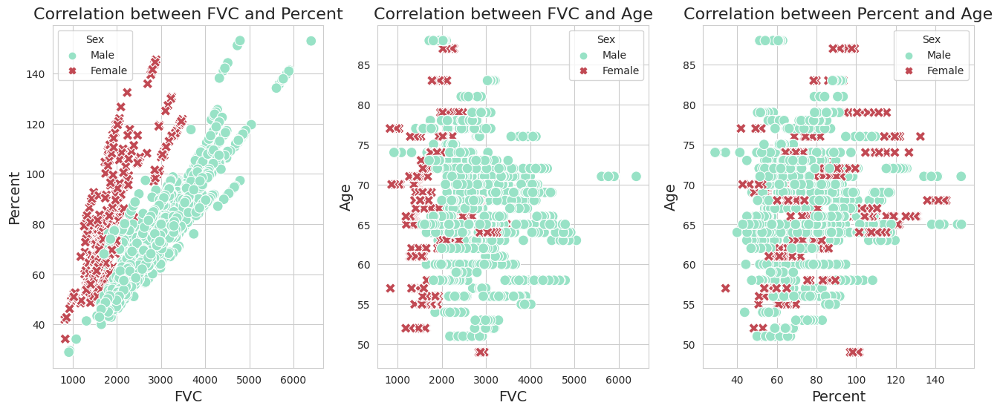

In [13]:
# Compute Correlation
corr1, _ = pearsonr(train["FVC"], train["Percent"])
corr2, _ = pearsonr(train["FVC"], train["Age"])
corr3, _ = pearsonr(train["Percent"], train["Age"])
print("Pearson Corr FVC x Percent: {:.4}".format(corr1), "\n" +
      "Pearson Corr FVC x Age: {:.0}".format(corr2), "\n" +
      "Pearson Corr Percent x Age: {:.2}".format(corr3))

# Figure
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (16, 6))

a = sns.scatterplot(x = train["FVC"], y = train["Percent"], palette=[custom_colors[2], custom_colors[6]],
                    hue = train["Sex"], style = train["Sex"], s=100, ax=ax1)

b = sns.scatterplot(x = train["FVC"], y = train["Age"], palette=[custom_colors[2], custom_colors[6]],
                    hue = train["Sex"], style = train["Sex"], s=100, ax=ax2)

c = sns.scatterplot(x = train["Percent"], y = train["Age"], palette=[custom_colors[2], custom_colors[6]],
                    hue = train["Sex"], style = train["Sex"], s=100, ax=ax3)

a.set_title("Correlation between FVC and Percent", fontsize = 16)
a.set_xlabel("FVC", fontsize = 14)
a.set_ylabel("Percent", fontsize = 14)

b.set_title("Correlation between FVC and Age", fontsize = 16)
b.set_xlabel("FVC", fontsize = 14)
b.set_ylabel("Age", fontsize = 14)

c.set_title("Correlation between Percent and Age", fontsize = 16)
c.set_xlabel("Percent", fontsize = 14)
c.set_ylabel("Age", fontsize = 14);

* Subplots Creation: The code creates a figure with two subplots arranged horizontally using plt.subplots(). Each subplot will display a point plot showing the mean values of FVC and Percent for different smoking statuses.
* Point Plots for Mean Values:
     * Mean FVC per Smoking Status: A point plot is created to show the mean FVC values for each smoking status. The x-axis represents the smoking status categories, and the y-axis represents the mean FVC values. Different colors are used to distinguish between the smoking statuses. The plot helps visualize how FVC values vary across different smoking statuses.
     * Mean Percent per Smoking Status: Another point plot is generated to display the mean Percent values for each smoking status. Similar to the first plot, this plot shows the relationship between smoking status and mean Percent values. It allows for a comparison of Percent values based on smoking status.
* Plot Customization:
    * Titles, x-axis labels, and y-axis labels are added to each subplot to provide context and clarity.
    * The plot layout is adjusted using plt.tight_layout() to ensure proper spacing between subplots.
    
    this code identifies and visualizes the decrease in FVC measurements over time for patients with significant FVC differences between their initial and final check-ins. It helps in understanding the progression of FVC values for selected patients and can provide insights into potential patterns or trends in lung function decline.

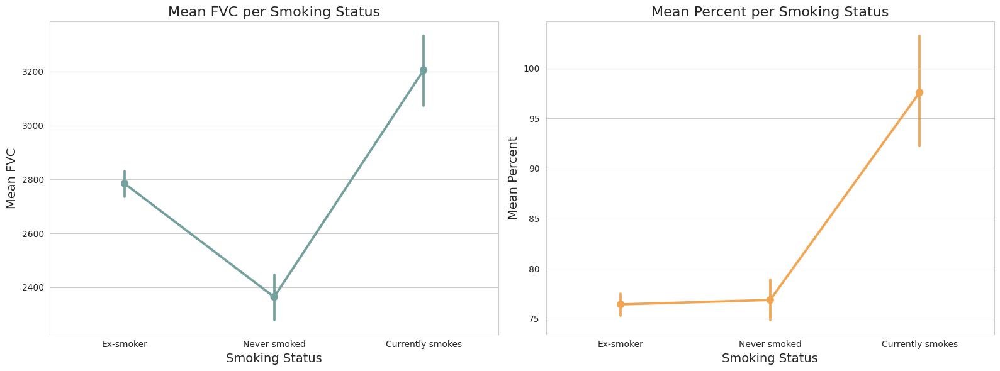

In [14]:
# Create subplots with adjusted colors and plot types
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot for Mean FVC per Smoking Status using a Point Plot
sns.pointplot(x=train["SmokingStatus"], y=train["FVC"], ax=ax1, color=custom_colors[0])
ax1.set_title("Mean FVC per Smoking Status", fontsize=16)
ax1.set_xlabel("Smoking Status", fontsize=14)
ax1.set_ylabel("Mean FVC", fontsize=14)

# Plot for Mean Percent per Smoking Status using a Point Plot
sns.pointplot(x=train["SmokingStatus"], y=train["Percent"], ax=ax2, color=custom_colors[4])
ax2.set_title("Mean Percent per Smoking Status", fontsize=16)
ax2.set_xlabel("Smoking Status", fontsize=14)
ax2.set_ylabel("Mean Percent", fontsize=14)

plt.tight_layout()
plt.show()

* Creating a Time Variable:
    * The code first counts the number of FVC check-ins in ascending order for each patient and stores this information in the data_time DataFrame.
    * It then creates a new variable "Time" in the train DataFrame, which ranks the weeks for each patient to track the progression of FVC measurements over time.
* Filtering Patients with Significant FVC Differences:
    * Initial and final FVC values are extracted for each patient to calculate the FVC differences.
    * Patients with the largest FVC differences are selected based on the calculated differences.
* Plotting FVC Decrease Over Weeks:
    * The code plots the FVC decrease over weeks for the selected top patients with the largest FVC differences.
    * A line plot is used to show the trend of FVC measurements over time for each patient, with different patients represented by different colors.
    * The plot is customized with a title, x-axis label (Weeks), and y-axis label (FVC) to provide context and interpretation.
    
    
    this code prepares the data by creating a path column to locate the CT scan files for each patient and then counts the number of CT scans available for each patient. This information can be valuable for further analysis and understanding the dataset in the context of pulmonary fibrosis progression.

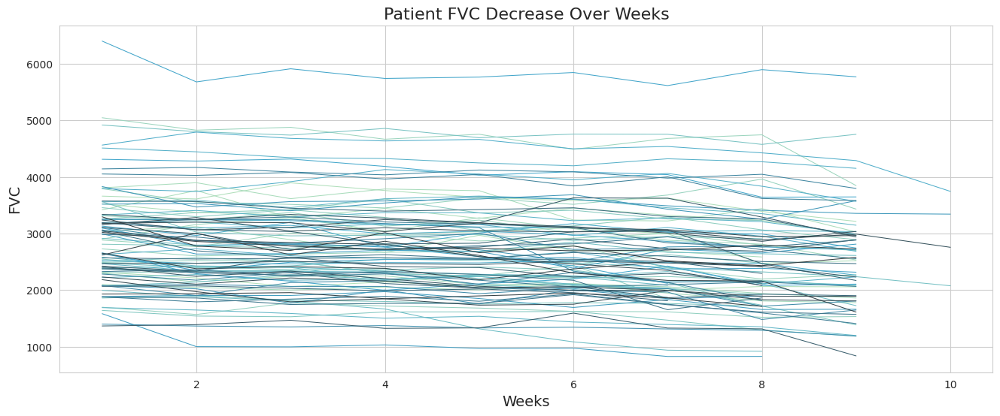

In [15]:
# Create a time variable to count the number of FVC check-ins in ascending order for each patient
data_time = train.groupby(by="Patient")["Weeks"].count().reset_index()
train["Time"] = train.groupby("Patient")["Weeks"].rank(method='dense')

# Filter patients with significant FVC differences between initial and final check-ins
min_fvc = train.loc[train["Time"] == 1, ["Patient", "FVC"]].reset_index(drop=True)
max_fvc = train.loc[train.groupby("Patient")["Weeks"].transform(max) == train["Weeks"], ["Patient", "FVC"]].reset_index(drop=True)

# Calculate FVC differences and select top patients with the largest differences
data = pd.merge(min_fvc, max_fvc, how="inner", on="Patient")
data["FVC_Difference"] = data["FVC_x"] - data["FVC_y"]

# Select top patients with the largest FVC differences
top_patients = data.sort_values("FVC_Difference", ascending=False).head(100)["Patient"]
filtered_data = train[train["Patient"].isin(top_patients)]

# Plotting the FVC decrease over weeks for selected patients
plt.figure(figsize=(16, 6))
sns.lineplot(x="Time", y="FVC", hue="Patient", data=filtered_data, legend=False,
             palette=sns.color_palette("GnBu_d", n_colors=100), size=1)

plt.title("Patient FVC Decrease Over Weeks", fontsize=16)
plt.xlabel("Weeks", fontsize=14)
plt.ylabel("FVC", fontsize=14)
plt.show()

* Setting the Base Directory:
    * The code sets the base directory where the CT scan files for the patients are located. This directory is specified as "../input/osic-pulmonary-fibrosis-progression/train".
* Creating Path Column:
    * A new column "Path" is created in the train DataFrame by concatenating the base directory with the patient IDs. This column contains the path to each patient's CT scan files.
* Counting the Number of CT Scans:
    * A new column "CT_number" is initialized with zeros to store the number of CT scans each patient has.
    * A loop iterates over the paths in the "Path" column, and for each path, it counts the number of files (CT scans) in that directory using os.listdir(path) and assigns the count to the corresponding row in the "CT_number" column.
    
    
    this code provides insights into the distribution of CT scans per patient, highlighting the range of scans each patient has undergone. The point plot visualization helps in understanding the frequency of CT scans across patients and identifies any potential patterns or variations in the data.

In [16]:
# Create base director for Train .dcm files
director = "../input/osic-pulmonary-fibrosis-progression/train"

# Create path column with the path to each patient's CT
train["Path"] = director + "/" + train["Patient"]

# Create variable that shows how many CT scans each patient has
train["CT_number"] = 0

for k, path in enumerate(train["Path"]):
    train["CT_number"][k] = len(os.listdir(path))

* Printing Min and Max Number of CT Scans:
    * The code prints the minimum and maximum number of CT scans per patient in the dataset using the min() and max() functions on the "CT_number" column of the train DataFrame.
* Calculating Scans per Patient:
    * The code groups the data by patient and counts the number of CT scans for each patient, storing this information in the data DataFrame.
    * The data is then sorted by the number of CT scans in ascending order for visualization.
* Plotting Number of CT Scans per Patient:
    * A point plot is created to show the distribution of the number of CT scans per patient.
    * Each point represents a patient, and the y-axis shows the count of CT scans.
    * A horizontal dashed line is added at the median value of 94 for reference.
    * The plot is customized with a title, x-axis label (Patient), y-axis label (Frequency), and a text annotation for the median value
    
    
    this code provides insights into the distribution of CT scans per patient, highlighting the range of scans each patient has undergone. The point plot visualization helps in understanding the frequency of CT scans across patients and identifies any potential patterns or variations in the data.

Minimum number of CT scans: 12 
Maximum number of CT scans: 1,018


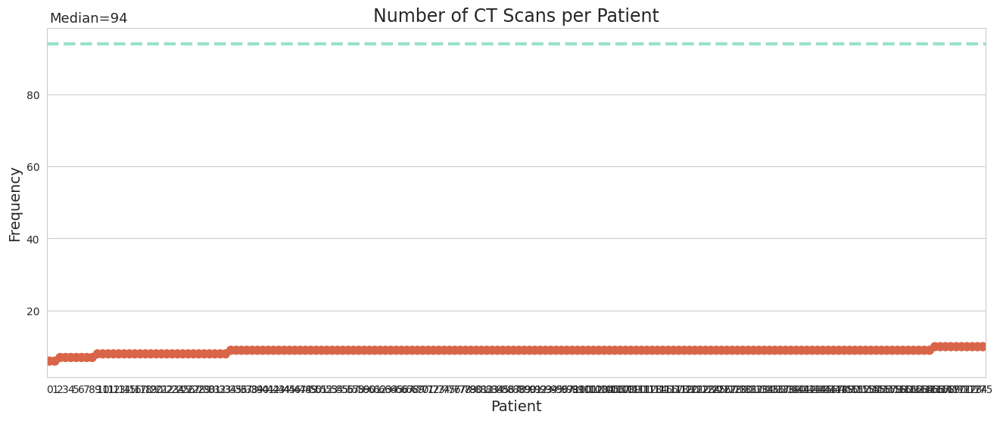

In [17]:
# Print Min and Max number of CT scans
print("Minimum number of CT scans: {}".format(train["CT_number"].min()), "\n" +
      "Maximum number of CT scans: {:,}".format(train["CT_number"].max()))

# Scans per Patient
data = train.groupby(by="Patient")["CT_number"].count().reset_index()

# Sort by CT_number
data = data.sort_values('CT_number').reset_index(drop=True)

# Plot with a different plot type (Point Plot)
plt.figure(figsize=(16, 6))
p = sns.pointplot(x=data.index, y=data["CT_number"], color=custom_colors[5])
plt.axhline(y=94, color=custom_colors[2], linestyle='--', lw=3)

plt.title("Number of CT Scans per Patient", fontsize=17)
plt.xlabel('Patient', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.text(0, 100, "Median=94", fontsize=13)

plt.show()

* Calculating Scans per Patient:
    * The code groups the data by patient and counts the number of CT scans for each patient, storing this information in the data DataFrame.
* Sorting by CT Number:
    * The data is then sorted by the number of CT scans in ascending order for visualization.
* Plotting Number of CT Scans per Patient:
    * A violin plot is created to display the distribution of the number of CT scans per patient.
    * The y-axis represents the count of CT scans, and the width of the plot at a given point indicates the frequency of patients with that number of scans.
    * The plot is customized with a title ("Number of CT Scans per Patient"), y-axis label ("Frequency"), and appropriate styling.
In summary, this code efficiently visualizes the distribution of CT scans per patient using a violin plot, providing insights into the variability and frequency of the number of scans across patients in the dataset.

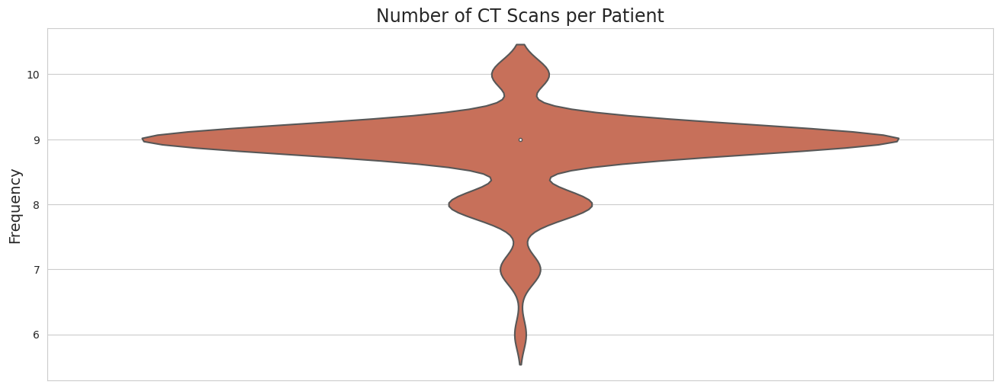

In [18]:
# Scans per Patient
data = train.groupby(by="Patient")["CT_number"].count().reset_index()

# Sort by CT_number
data = data.sort_values('CT_number').reset_index(drop=True)

# Plot with a Violin Plot
plt.figure(figsize=(16, 6))
sns.violinplot(y=data["CT_number"], color=custom_colors[5])

plt.title("Number of CT Scans per Patient", fontsize=17)
plt.ylabel('Frequency', fontsize=14)

plt.show()

* Setting the Base Directory:
    * The code sets the base directory where the CT scan files for the patients are located. This directory is specified as "../input/osic-pulmonary-fibrosis-progression/train".
* Creating Path Column:
    * A new column "Path" is created in the train DataFrame by combining the base directory with each patient's ID. This column contains the path to each patient's CT scan files.
* Counting the Number of CT Scans:
    * A new column "CT_number" is initialized with zeros to store the number of CT scans each patient has.
    * A loop iterates over the paths in the "Path" column, and for each path, it counts the number of files (CT scans) in that directory using os.listdir(path) and assigns the count to the corresponding row in the "CT_number" column.
    
In summary, this code prepares the data by creating a path column to locate the CT scan files for each patient and then counts the number of CT scans available for each patient. This information can be valuable for further analysis and understanding the dataset in the context of pulmonary fibrosis progression.

In [19]:
# Create base director for Train .dcm files
director = "../input/osic-pulmonary-fibrosis-progression/train"

# Create path column with the path to each patient's CT
train["Path"] = director + "/" + train["Patient"]

# Create variable that shows how many CT scans each patient has
train["CT_number"] = 0

for k, path in enumerate(train["Path"]):
    train["CT_number"][k] = len(os.listdir(path))

The first source from Reddit discusses how to plot the 10 most frequent values in a barplot using Seaborn. The user was trying to plot the 10 most frequent values from the value_count() output but faced issues with the barplot representation. They mentioned trying different methods like sns.barplot(df['var'].value_counts().head(10)) and sns.barplot(df['var'].value_counts()[:10]), which did not provide the desired output. Sorting by count versus index was suggested as a potential solution.

The second source from GeeksforGeeks explains how to show values on a Seaborn barplot in Python. It details the process of plotting values on a Seaborn barplot using sns.barplot() function and the sub-method containers returned by sns.barplot(). The article provides syntax, parameters, and code examples to demonstrate how to display values on top of a Seaborn barplot. It involves importing necessary packages like pandas, numpy, and seaborn, reading datasets, creating barplots, and displaying bar values on the plot.


In summary, the Reddit post addresses challenges in plotting the 10 most frequent values in a barplot using Seaborn, while the GeeksforGeeks article offers a detailed guide on how to show values on Seaborn barplots in Python.


Minimum number of CT scans: 12
Maximum number of CT scans: 1,018


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175]),
 [Text

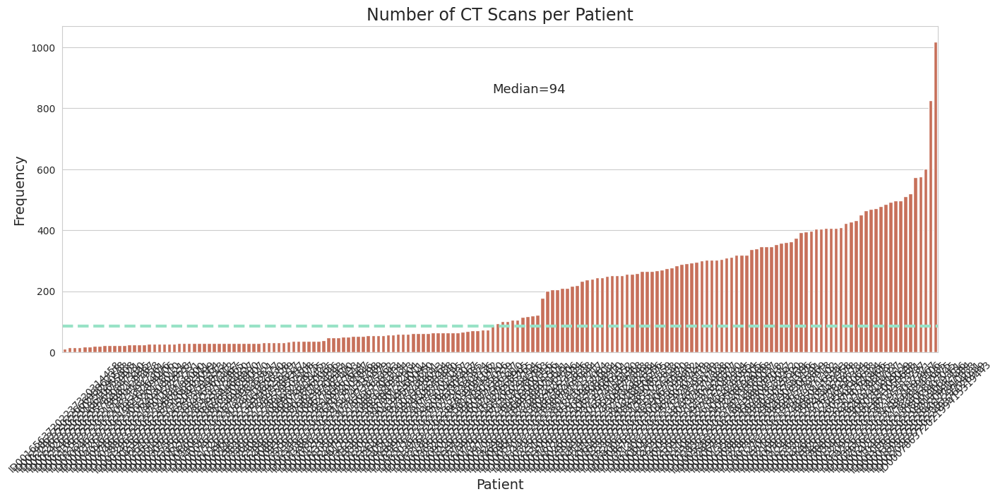

In [20]:
# Print Min and Max number of CT scans
print("Minimum number of CT scans: {}".format(train["CT_number"].min()))
print("Maximum number of CT scans: {:,}".format(train["CT_number"].max()))

# Scans per Patient
data = train.groupby(by="Patient")["CT_number"].first().reset_index()
# Sort by Weeks
data = data.sort_values('CT_number').reset_index(drop=True)

# Plot
plt.figure(figsize=(16, 6))
p = sns.barplot(x=data["Patient"], y=data["CT_number"], color=custom_colors[5])
plt.axhline(y=85, color=custom_colors[2], linestyle='--', lw=3)

plt.title("Number of CT Scans per Patient", fontsize=17)
plt.xlabel('Patient', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.text(86, 850, "Median=94", fontsize=13)

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

* Importing Libraries:
    * The code imports necessary libraries: pydicom for working with DICOM files and matplotlib.pyplot for plotting images.
* Reading and Displaying DICOM Image:
    * It specifies the file path of a DICOM image to be read and stored in the dataset variable using pydicom.dcmread(path).
    * Information about the DICOM image is then printed, including Patient ID, Modality, Rows, and Columns.
    * A matplotlib figure is created with a size of 7x7 inches to display the image.
    * The DICOM image's pixel array is visualized using plt.imshow(dataset.pixel_array, cmap="plasma"), where cmap="plasma" sets the color map for the image.
    * plt.axis('off') is used to turn off the axis labels for a cleaner image display.
    * Finally, plt.show() is called to show the DICOM image.
    
 In summary, this code snippet reads a DICOM image, extracts relevant information from the metadata, and displays the image using matplotlib. It provides a simple and effective way to view medical imaging data stored in DICOM format.

Patient id.......: ID00007637202177411956430 
Modality.........: CT 
Rows.............: 512 
Columns..........: 512


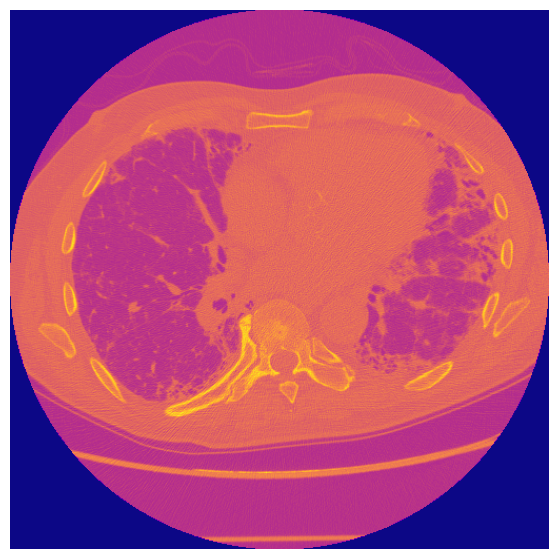

In [21]:
import pydicom
import matplotlib.pyplot as plt

path = "../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/19.dcm"
dataset = pydicom.dcmread(path)

print("Patient id.......:", dataset.PatientID, "\n" +
      "Modality.........:", dataset.Modality, "\n" +
      "Rows.............:", dataset.Rows, "\n" +
      "Columns..........:", dataset.Columns)

plt.figure(figsize=(7, 7))
plt.imshow(dataset.pixel_array, cmap="plasma")
plt.axis('off')
plt.show()

* The code beow reads DICOM images from a specified directory related to a patient's data.
* It orders the DICOM files based on their numeric values in the filenames.
* It reads the DICOM files using Pydicom library and stores them in a list called datasets.
* It then plots the pixel arrays of the DICOM images in a grid layout using Matplotlib.
* The code visualizes a subset of the DICOM images (up to 30 images) in a 10x3 grid with image numbers as titles.


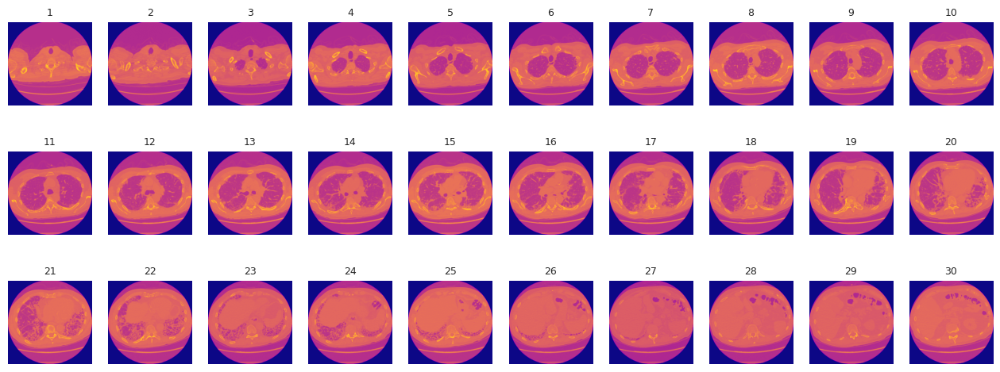

In [22]:
import pydicom


patient_dir = "../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430"
datasets = []

# First, order the files in the dataset
files = os.listdir(patient_dir)
files.sort(key=lambda f: int(re.sub('\D', '', f)))

# Read in the Dataset
for dcm in files:
    path = os.path.join(patient_dir, dcm)
    datasets.append(pydicom.dcmread(path))

# Plot the images
fig = plt.figure(figsize=(16, 6))
columns = 10
rows = 3

for i in range(1, min(columns*rows, len(datasets)) + 1):
    img = datasets[i-1].pixel_array
    ax = fig.add_subplot(rows, columns, i)
    ax.imshow(img, cmap="plasma")
    ax.set_title(i, fontsize=9)
    ax.axis('off')

plt.show()

* PIL (Python Imaging Library) Import:
    * from PIL import Image imports the Python Imaging Library, which provides capabilities for opening, manipulating, and saving many different image file formats.
* IPython Display Import:
    * from IPython.display import Image as show_gif imports the Image function from IPython's display module. This allows displaying images, including GIFs, directly in Jupyter notebooks.
* Scipy Misc Import:
    * import scipy.misc imports the misc module from SciPy, which includes various image processing functions. However, it's important to note that scipy.misc has been deprecated in newer versions of SciPy in favor of other image processing libraries like scikit-image.

 In summary, this code snippet sets up the environment for working with images, including opening, displaying, and potentially processing them using the Python Imaging Library (PIL), IPython's display functionality, and the deprecated scipy.misc module.

In [23]:
from PIL import Image
from IPython.display import Image as show_gif
import scipy.misc

* Selecting a Patient:
    * The function selects a patient based on the number of CT scans provided. It retrieves the patient ID from the dataset based on the specified number of CT scans.
* Reading and Ordering CT Scan Files:
    * It reads the DICOM (.dcm) files for the selected patient, orders them numerically, and stores them in a list of datasets.
* Converting to PNG:
    * The function converts each DICOM image to a PNG format and saves them in a new directory named png_patientID.
* Creating GIF:
    * It reads the PNG images, orders them, creates frames from the images, and then saves them as a GIF file named gif_patientID.gif.
    * The GIF is set to loop indefinitely with a duration of 200 milliseconds per frame.

In summary, this function automates the process of converting a series of CT scan images for a specific patient into a GIF for easier visualization and analysis.

In [24]:
import matplotlib.image as mpimg

def create_gif(number_of_CT=87):
    """Selects a patient based on the CT number and creates a GIF with their CT scans."""
    
    # Select a patient based on the CT number
    patient = train[train["CT_number"] == number_of_CT].sample(random_state=1)["Patient"].values[0]
    
    # Read in .dcm files
    patient_dir = "../input/osic-pulmonary-fibrosis-progression/train/" + patient
    datasets = []

    # Order the files in the dataset
    files = os.listdir(patient_dir)
    files.sort(key=lambda f: int(re.sub('\D', '', f)))

    # Read in the dataset from the patient path
    for dcm in files:
        path = os.path.join(patient_dir, dcm)
        datasets.append(pydicom.dcmread(path))
        
    # Save as .png
    # Create directory to save the png files
    if not os.path.isdir(f"png_{patient}"):
        os.mkdir(f"png_{patient}")

    # Save images to PNG
    for i, dataset in enumerate(datasets):
        img = dataset.pixel_array
        mpimg.imsave(f'png_{patient}/img_{i}.png', img)
        
    # Create GIF
    # Order the files in the dataset (again)
    files = os.listdir(f"../working/png_{patient}")
    files.sort(key=lambda f: int(re.sub('\D', '', f)))

    # Create the frames
    frames = []

    # Create frames
    for file in files:
        new_frame = Image.open(f"../working/png_{patient}/" + file)
        frames.append(new_frame)

    # Save as a GIF file that loops forever
    frames[0].save(f'gif_{patient}.gif', format='GIF',
                   append_images=frames[1:],
                   save_all=True,
                   duration=200, loop=0)

* Creating GIFs:
    * The create_gif function is called three times with different numbers of CT scans (12, 30, and 87) for different patients. This generates GIFs from the CT scan images for each patient.
* Printing PNG File Counts:
    * The code is commented out, but it intends to print the number of PNG files created for each patient after generating the GIFs.
    * It checks the number of PNG files in the directories where the PNG images were saved for each patient.
    In summary, this code snippet automates the creation of GIFs from CT scan images for different patients with varying numbers of CT scans and then checks the number of PNG files generated for each patient's GIF creation process.

In [25]:
create_gif(number_of_CT=12)
create_gif(number_of_CT=30)
create_gif(number_of_CT=87)

#print("First file len:", len(os.listdir("../working/png_ID00165637202237320314458")), "\n" +
     #"Second file len:", len(os.listdir("../working/png_ID00199637202248141386743")), "\n" +
      #"Third file len:", len(os.listdir("../working/png_ID00340637202287399835821")))


* show_gif: This is the name of the function being called. It's likely a custom function that someone has defined elsewhere in their code.
* filename="./gif_ID00165637202237320314458.gif": This part specifies the path and name of the GIF file that the function should display. In this case, the GIF file is named "gif_ID00165637202237320314458.gif" and is located in the current directory (denoted by "./").
* format='png': This parameter specifies the format in which the GIF should be displayed. However, it seems unusual because GIFs are typically displayed as GIFs themselves, not as PNG images. This might be a mistake or a specific requirement of the show_gif function.
* width=400, height=400: These parameters specify the width and height, respectively, of the displayed image. In this case, the image will be displayed with a width of 400 pixels and a height of 400 pixels.
* So, in simple terms, this line of code is telling a function called show_gif to display the GIF file named "gif_ID00165637202237320314458.gif" with a width of 400 pixels and a height of 400 pixels. However, it's unusual that the format is specified as 'png' since GIFs are typically displayed as GIFs.

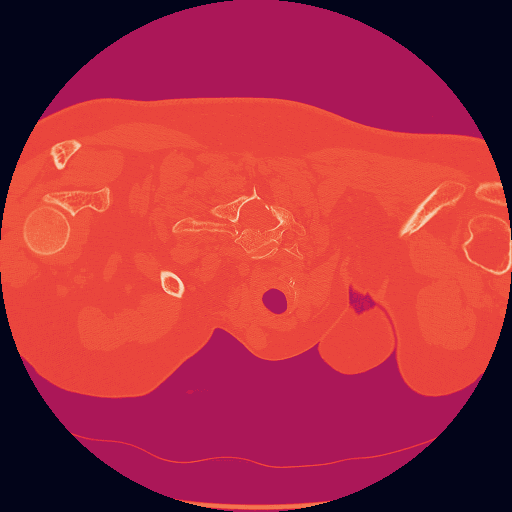

In [26]:
show_gif(filename="./gif_ID00165637202237320314458.gif", format='png', width=400, height=400)

* show_gif: Again, this is likely the name of a function that displays animated GIF files.
* filename: This parameter specifies the path and name of the GIF file that the function should display. In the first line, it's showing a GIF named "gif_ID00340637202287399835821.gif", and in the second line, it's showing a GIF named "gif_ID00199637202248141386743.gif". Both files are assumed to be located in the current directory (denoted by "./").
* format='png': This parameter specifies the format in which the GIF should be displayed. As previously mentioned, it's unusual to specify 'png' since GIFs are typically displayed as GIFs themselves.
* width=400, height=400: These parameters specify the width and height, respectively, of the displayed images. In both cases, the images will be displayed with a width of 400 pixels and a height of 400 pixels.
* In simple terms, these lines of code are telling a function called show_gif to display two different GIF files with identical dimensions of 400 pixels by 400 pixels. Again, it's noteworthy that the format is specified as 'png', which is uncommon for displaying GIFs.

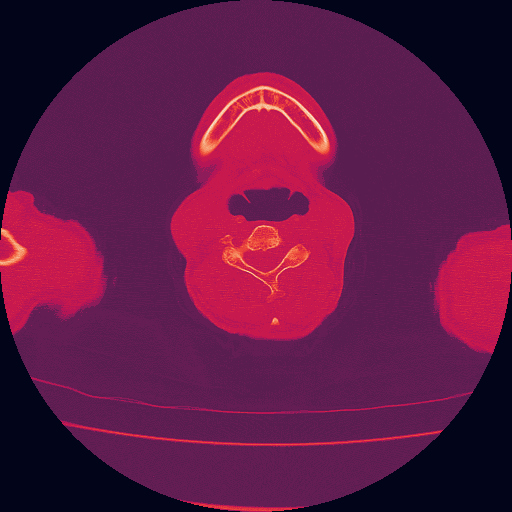

In [27]:
show_gif(filename="./gif_ID00340637202287399835821.gif", format='png', width=400, height=400)
show_gif(filename="./gif_ID00199637202248141386743.gif", format='png', width=400, height=400)

* Image Preprocessing:
    * It calculates the mean and standard deviation of the image, then standardizes the image by subtracting the mean and dividing by the standard deviation. This step helps in normalizing the image data.
    * It selects a region of interest (ROI) within the image, likely containing the lungs, for further processing.
* Thresholding and Segmentation:
    * It uses K-means clustering to separate foreground (soft tissue/bone) from background (lung/air) based on intensity values.
    * After thresholding, it performs erosion and dilation operations to remove noise and refine the mask.
* Labeling and Filtering:
    * It labels different regions in the image and filters out the regions that are unlikely to be lungs based on their size and position within the image.
* Mask Creation:
 
    * It creates a binary mask where pixels corresponding to the lungs are marked as 1 and others as 0.
* Visualization (Optional): 
    * If the display parameter is set to True, it visualizes the intermediate steps of the process, including the original image, thresholded image, eroded and dilated image, color-labeled regions, final mask, and the original image with the mask applied.
* Return:
    * It returns the masked image, where only the pixels corresponding to the lungs are retained.
 This function is designed to automate the process of segmenting lungs from medical images, which is often a crucial step in various medical image analysis tasks. It employs image processing techniques such as thresholding, morphological operations, and region labeling to achieve this segmentation.

In [28]:
def make_lungmask(img, display=False):
    row_size= img.shape[0]
    col_size = img.shape[1]
    
    mean = np.mean(img)
    std = np.std(img)
    img = img-mean
    img = img/std
    
    # Find the average pixel value near the lungs
        # to renormalize washed out images
    middle = img[int(col_size/5):int(col_size/5*4),int(row_size/5):int(row_size/5*4)] 
    mean = np.mean(middle)  
    max = np.max(img)
    min = np.min(img)
    
    # To improve threshold finding, I'm moving the 
    # underflow and overflow on the pixel spectrum
    img[img==max]=mean
    img[img==min]=mean
    
    # Using Kmeans to separate foreground (soft tissue / bone) and background (lung/air)
    
    kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
    centers = sorted(kmeans.cluster_centers_.flatten())
    threshold = np.mean(centers)
    thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image

    # First erode away the finer elements, then dilate to include some of the pixels surrounding the lung.  
    # We don't want to accidentally clip the lung.

    eroded = morphology.erosion(thresh_img,np.ones([3,3]))
    dilation = morphology.dilation(eroded,np.ones([8,8]))

    labels = measure.label(dilation) # Different labels are displayed in different colors
    label_vals = np.unique(labels)
    regions = measure.regionprops(labels)
    good_labels = []
    for prop in regions:
        B = prop.bbox
        if B[2]-B[0]<row_size/10*9 and B[3]-B[1]<col_size/10*9 and B[0]>row_size/5 and B[2]<col_size/5*4:
            good_labels.append(prop.label)
    mask = np.ndarray([row_size,col_size],dtype=np.int8)
    mask[:] = 0


    #  After just the lungs are left, we do another large dilation
    #  in order to fill in and out the lung mask 
    
    for N in good_labels:
        mask = mask + np.where(labels==N,1,0)
    mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation

    if (display):
        fig, ax = plt.subplots(3, 2, figsize=[12, 12])
        ax[0, 0].set_title("Original")
        ax[0, 0].imshow(img, cmap='gray')
        ax[0, 0].axis('off')
        ax[0, 1].set_title("Threshold")
        ax[0, 1].imshow(thresh_img, cmap='gray')
        ax[0, 1].axis('off')
        ax[1, 0].set_title("After Erosion and Dilation")
        ax[1, 0].imshow(dilation, cmap='gray')
        ax[1, 0].axis('off')
        ax[1, 1].set_title("Color Labels")
        ax[1, 1].imshow(labels)
        ax[1, 1].axis('off')
        ax[2, 0].set_title("Final Mask")
        ax[2, 0].imshow(mask, cmap='gray')
        ax[2, 0].axis('off')
        ax[2, 1].set_title("Apply Mask on Original")
        ax[2, 1].imshow(mask*img, cmap='gray')
        ax[2, 1].axis('off')
        
        plt.show()
    return mask*img

* Selecting a Sample:
    * The code selects a sample DICOM image file from a specified path. DICOM is a standard format used for medical imaging data.
* Reading the DICOM File:
    * It reads the DICOM file using the pydicom library. This library is commonly used to work with DICOM files in Python.
* After reading the file, it extracts the pixel array from the DICOM dataset, which contains the actual image data.
* Creating a Lung Mask: 
    * It calls a function named make_lungmask to generate a mask for isolating the lungs from the rest of the image.
    * The img variable, which contains the pixel array of the DICOM image, is passed to the make_lungmask function.
    * Additionally, the display=True parameter indicates that the function should display intermediate steps of the lung masking process.
* Visualization:
    * The make_lungmask function displays intermediate steps of the lung masking process, likely including the original image, thresholded image, eroded and dilated image, color-labeled regions, final mask, and the original image with the mask applied.
    
    In summary, this code snippet reads a DICOM image, processes it to isolate the lungs using a lung masking function, and displays the intermediate steps of the masking process for visualization purposes. It's part of a larger process for analyzing medical images, particularly for tasks related to pulmonary fibrosis progression analysis.

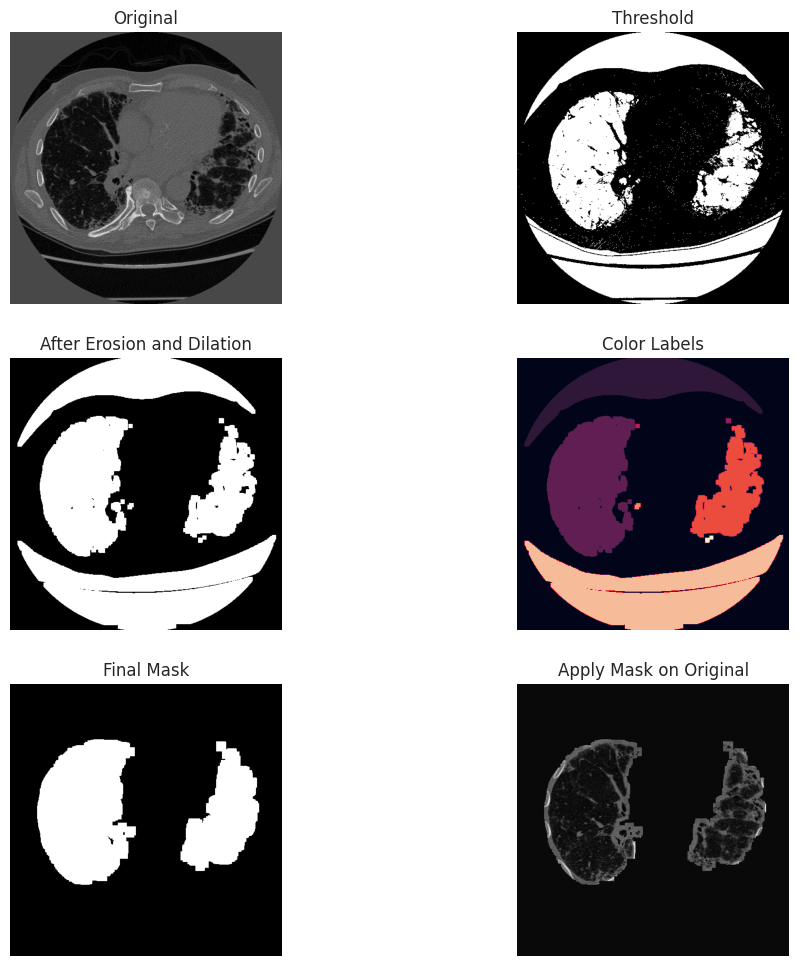

In [29]:
# Select a sample
path = "../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/19.dcm"
dataset = pydicom.dcmread(path)
img = dataset.pixel_array

# Masked image
mask_img = make_lungmask(img, display=True)

* Setting up the Environment:

    * patient_dir: This variable contains the path to the directory containing DICOM files related to a specific patient. DICOM files are a standard format for medical images.
* datasets: This list will store the DICOM datasets read from the files.
* Ordering DICOM Files: 
    * The code first collects all the DICOM files present in the patient_dir directory and sorts them based on their numerical order. This ensures that the files are processed in the correct sequence.
* Reading DICOM Files:
    * It iterates over the sorted list of DICOM files, reads each file using pydicom.dcmread(), and appends the resulting DICOM dataset to the datasets list.
* Extracting Pixel Arrays:
    * For each dataset in the datasets list, it extracts the pixel array using the pixel_array attribute of the DICOM dataset. This pixel array represents the image data.
* Displaying Masks:
    * It sets up a figure to display the masks generated from the lung segmentation process.
    * It iterates over the datasets and generates a lung mask for each image using the make_lungmask() function.
    * Each mask is displayed in a separate subplot of the figure using plt.imshow().
    * The loop continues for columns * rows iterations, creating a grid of subplots to display the masks for each image.
    * plt.title() assigns a title to each subplot, indicating the index of the image.
    * plt.axis('off') removes axis ticks and labels from each subplot.

Overall, this code reads DICOM files related to a specific patient, processes them to extract image data, generates lung masks using a segmentation function, and displays the resulting masks in a grid for visual inspection. It's a common workflow in medical image analysis tasks, particularly for analyzing pulmonary fibrosis progression.

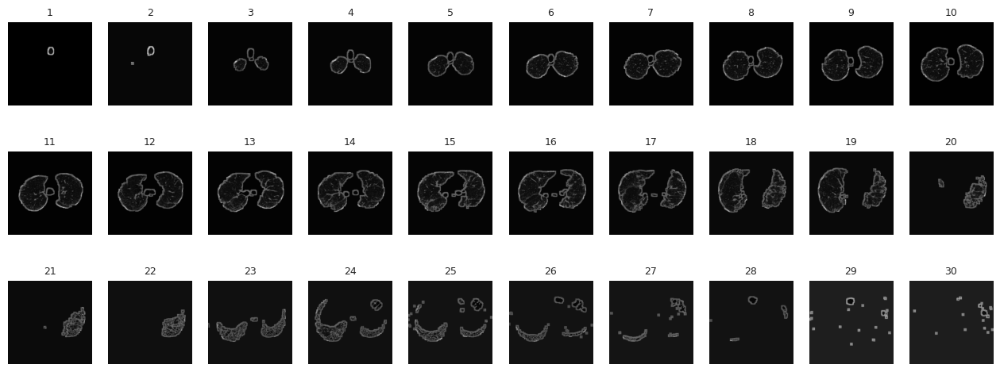

In [30]:
patient_dir = "../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430"
datasets = []

# First Order the files in the dataset
files = []
for dcm in list(os.listdir(patient_dir)):
    files.append(dcm) 
files.sort(key=lambda f: int(re.sub('\D', '', f)))

# Read in the Dataset
for dcm in files:
    path = patient_dir + "/" + dcm
    datasets.append(pydicom.dcmread(path))
    
imgs = []
for data in datasets:
    img = data.pixel_array
    imgs.append(img)
    
    
# Show masks
fig=plt.figure(figsize=(16, 6))
columns = 10
rows = 3

for i in range(1, columns*rows +1):
    img = make_lungmask(datasets[i-1].pixel_array)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap="gray")
    plt.title(i, fontsize = 9)
    plt.axis('off');

In [31]:
import sys
!cp ../input/rapids/rapids.0.14.0 /opt/conda/envs/rapids.tar.gz
!cd /opt/conda/envs/ && tar -xzvf rapids.tar.gz > /dev/null
sys.path = ["/opt/conda/envs/rapids/lib/python3.7/site-packages"] + sys.path
sys.path = ["/opt/conda/envs/rapids/lib/python3.7"] + sys.path
sys.path = ["/opt/conda/envs/rapids/lib"] + sys.path 
!cp /opt/conda/envs/rapids/lib/libxgboost.so /opt/conda/lib/

cp: cannot stat '../input/rapids/rapids.0.14.0': No such file or directory
tar (child): rapids.tar.gz: Cannot open: No such file or directory
tar (child): Error is not recoverable: exiting now
tar: Child returned status 2
tar: Error is not recoverable: exiting now
cp: cannot stat '/opt/conda/envs/rapids/lib/libxgboost.so': No such file or directory


In [32]:
def get_observation_data(path):
    """Get information from the .dcm files.
    path: complete path to the .dcm file"""

    image_data = pydicom.read_file(path)
    
    # Dictionary to store the information from the image
    observation_data = {
        "FileNumber" : path.split("/")[5],
        "Rows" : image_data.get("Rows"),
        "Columns" : image_data.get("Columns"),
        "PatientID" : image_data.get("PatientID"),
        "BodyPartExamined" : image_data.get("BodyPartExamined"),
        "RotationDirection" : image_data.get("RotationDirection"),
        "ConvolutionKernel" : image_data.get("ConvolutionKernel"),
        "PatientPosition" : image_data.get("PatientPosition"),
        "PhotometricInterpretation" : image_data.get("PhotometricInterpretation"),
        "Modality" : image_data.get("Modality"),
        "StudyInstanceUID" : image_data.get("StudyInstanceUID"),
        "PixelPaddingValue" : image_data.get("PixelPaddingValue"),
        "SamplesPerPixel" : image_data.get("SamplesPerPixel"),
        "BitsAllocated" : image_data.get("BitsAllocated"),
        "BitsStored" : image_data.get("BitsStored"),
        "HighBit" : image_data.get("HighBit"),
        "PixelRepresentation" : image_data.get("PixelRepresentation"),
        "RescaleType" : image_data.get("RescaleType"),
    }

    # Integer columns
    int_columns = ["SliceThickness", "KVP", "DistanceSourceToDetector", 
        "DistanceSourceToPatient", "GantryDetectorTilt", "TableHeight", 
        "XRayTubeCurrent", "GeneratorPower", "WindowCenter", "WindowWidth", 
        "SliceLocation", "RescaleIntercept", "RescaleSlope"]
    for k in int_columns:
        observation_data[k] = int(image_data.get(k)) if k in image_data else None

    # String columns
    str_columns = ["ImagePositionPatient", "ImageOrientationPatient", "ImageType", "PixelSpacing"]
    for k in str_columns:
        observation_data[k] = str(image_data.get(k)) if k in image_data else None

    
    return observation_data

In [33]:
p = "../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/10.dcm"
example = get_observation_data(p)
# Get full paths for the images
paths = []
for path in train["Path"]:
    for doc in os.listdir(path):
        paths.append(path + "/" + doc)
        
# How many paths?
print("There are {:,} paths in total.".format(len(paths)))

There are 289,826 paths in total.


**From the above code we infer the required information we get from dcm files for example the above code gets a total of 289826 paths in total for a given directory.**

tqdm library
* Progress Tracking: tqdm is a Python library designed for tracking the progress of iterative tasks, providing users with real-time feedback on the completion status.

* Versatile Compatibility: It seamlessly integrates with various iterable types, including lists, tuples, dictionaries, and custom iterators, catering to diverse programming needs.

* Customization Options: Users can easily customize the appearance and behavior of progress bars, tailoring them to specific preferences through features such as style selection and format adjustment.

* Concurrency Support: tqdm supports concurrent programming paradigms like multiprocessing and multithreading, allowing for efficient tracking of progress in concurrent tasks.

* After tracking tqdm paths (289826) we are finding exceptions in meta data.
* This tqdm helps us finding that exceptions.
* Here we get around 279 exceptions in meta data.

In [34]:
import tqdm
# Create a dictionary with the data
exceptions = 0
dicts = []

for path in tqdm.tqdm(paths):
    # Get info in dict format
    try:
        d = get_observation_data(path)
        dicts.append(d)
    except Exception as e:
        exceptions += 1
        continue

# Convert into a cudf dataframe
# meta_train_data = cudf.DataFrame(data=dicts, columns=example.keys())
meta_train_data = pd.DataFrame(data=dicts, columns=example.keys())

# Export information to a .csv
meta_train_data.to_csv("meta_train.csv", index=False)

100%|██████████| 289826/289826 [22:17<00:00, 216.63it/s]


In [35]:
print("Exceptions: {}".format(exceptions))
meta_train_data.head()

Exceptions: 279


,FileNumber,Rows,Columns,PatientID,BodyPartExamined,RotationDirection,ConvolutionKernel,PatientPosition,PhotometricInterpretation,Modality,...,GeneratorPower,WindowCenter,WindowWidth,SliceLocation,RescaleIntercept,RescaleSlope,ImagePositionPatient,ImageOrientationPatient,ImageType,PixelSpacing
0,12.dcm,512,512,ID00007637202177411956430,Chest,CW,BONE,FFS,MONOCHROME2,CT,...,9600.0,-500,-1500,-179.0,-1024,1,"[-158.700, -153.500, -179.750]","[1.000000, 0.000000, 0.000000, 0.000000, 1.000...","['ORIGINAL', 'PRIMARY', 'AXIAL']","[0.652344, 0.652344]"
1,18.dcm,512,512,ID00007637202177411956430,Chest,CW,BONE,FFS,MONOCHROME2,CT,...,9600.0,-500,-1500,-239.0,-1024,1,"[-158.700, -153.500, -239.750]","[1.000000, 0.000000, 0.000000, 0.000000, 1.000...","['ORIGINAL', 'PRIMARY', 'AXIAL']","[0.652344, 0.652344]"
2,9.dcm,512,512,ID00007637202177411956430,Chest,CW,BONE,FFS,MONOCHROME2,CT,...,9600.0,-500,-1500,-149.0,-1024,1,"[-158.700, -153.500, -149.750]","[1.000000, 0.000000, 0.000000, 0.000000, 1.000...","['ORIGINAL', 'PRIMARY', 'AXIAL']","[0.652344, 0.652344]"
3,22.dcm,512,512,ID00007637202177411956430,Chest,CW,BONE,FFS,MONOCHROME2,CT,...,9600.0,-500,-1500,-279.0,-1024,1,"[-158.700, -153.500, -279.750]","[1.000000, 0.000000, 0.000000, 0.000000, 1.000...","['ORIGINAL', 'PRIMARY', 'AXIAL']","[0.652344, 0.652344]"
4,25.dcm,512,512,ID00007637202177411956430,Chest,CW,BONE,FFS,MONOCHROME2,CT,...,9600.0,-500,-1500,-309.0,-1024,1,"[-158.700, -153.500, -309.750]","[1.000000, 0.000000, 0.000000, 0.000000, 1.000...","['ORIGINAL', 'PRIMARY', 'AXIAL']","[0.652344, 0.652344]"


---Missing Columns---
PixelPaddingValue missing percentage: 0.85
RescaleType missing percentage: 0.56
DistanceSourceToDetector missing percentage: 0.40
DistanceSourceToPatient missing percentage: 0.40
GantryDetectorTilt missing percentage: 0.00
GeneratorPower missing percentage: 0.34
SliceLocation missing percentage: 0.01
ImagePositionPatient missing percentage: 0.01
ImageOrientationPatient missing percentage: 0.01


Text(0.5, 1.0, 'Metadata Missing Values')

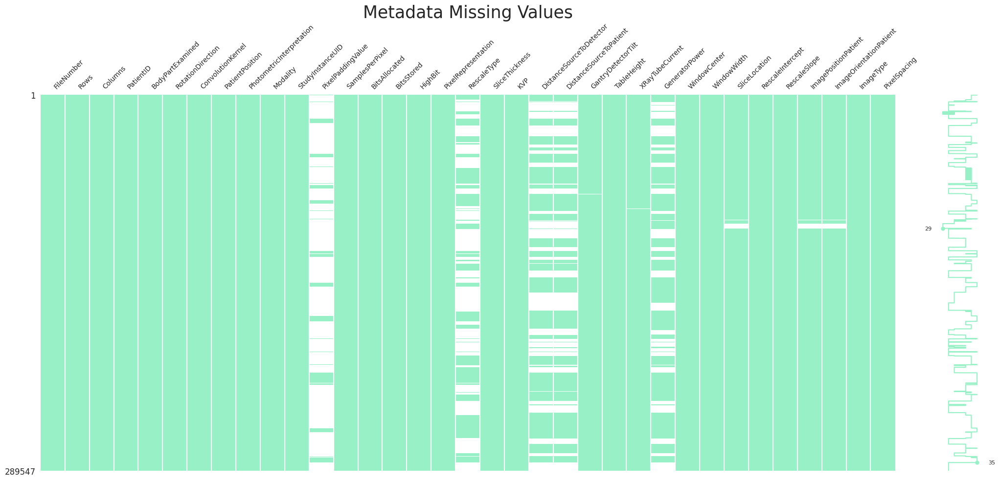

In [36]:
# Calculate missing percentages for specific columns
missing_columns = ["PixelPaddingValue", "RescaleType", "DistanceSourceToDetector", 
                   "DistanceSourceToPatient", "GantryDetectorTilt", "GeneratorPower", 
                   "SliceLocation", "ImagePositionPatient", "ImageOrientationPatient"]

missing_percentages = {col: meta_train_data[col].isna().sum() / len(meta_train_data[col]) for col in missing_columns}

# Print missing percentages
print("---Missing Columns---")
for col, percentage in missing_percentages.items():
    print(f"{col} missing percentage: {percentage:.2f}")

# Visualize missing values using matrix plot
ax = msno.matrix(meta_train_data, color=(152/255, 241/255, 198/255), fontsize=10)
plt.title("Metadata Missing Values", fontsize=25)

## Laplace Log Likelihood
![](https://i.imgur.com/tEIZvli.png)
*Image Credits: https://en.wikipedia.org/wiki/Laplace_distribution*

The evaluation metric of this competition is a modified version of Laplace Log Likelihood. Read more about it on the [Evaluation Page](https://www.kaggle.com/c/osic-pulmonary-fibrosis-progression/overview/evaluation).

![LLL.png](attachment:LLL.png)

This notebook explores the functioning of this metric with some examples and visualizations.


In [37]:
import numpy as np
import pandas as pd
import seaborn as sns

from bokeh.layouts import row, column
from bokeh.models import ColumnDataSource, CustomJS, Label, Range1d, Slider, Span
from bokeh.plotting import figure, output_notebook, show

output_notebook()

## reading data
df_train = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

Loading BokehJS ...

## FVC Distribution
Let's look at the distribution of the target variable **FVC**.


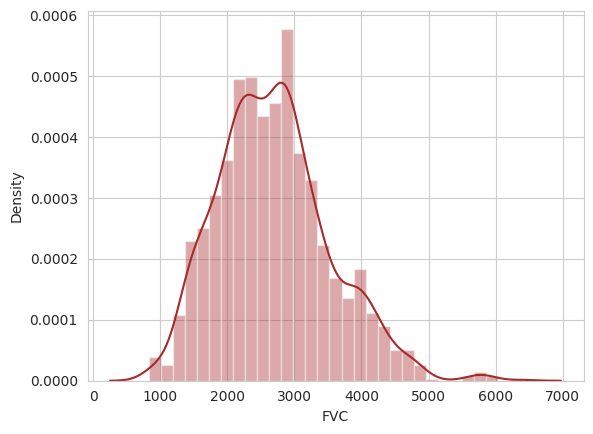

In [38]:
sns.distplot(df_train.FVC, color = "brown");

FVC ranges from **827 to 6399** and seems to have a (visually) normal distribution with **mean 2690** and **standard deviation 833**.

## Evaluation Metric
Note that not only do we need to predict the FVC but also a confidence value of the prediction. The term *confidence* is a bit confusing (as lower value means more confident) and it might be better to just consider it as the *standard deviation* (or the *uncertainty*).   

Let's define a function and then use it with some examples and understand the metric.


In [39]:
def laplace_log_likelihood(actual_fvc, predicted_fvc, confidence, return_values = False):
    """
    Calculates the modified Laplace Log Likelihood score for this competition.
    """
    sd_clipped = np.maximum(confidence, 70)
    delta = np.minimum(np.abs(actual_fvc - predicted_fvc), 1000)
    metric = - np.sqrt(2) * delta / sd_clipped - np.log(np.sqrt(2) * sd_clipped)

    if return_values:
        return metric
    else:
        return np.mean(metric)


## default benchmark
laplace_log_likelihood(df_train.FVC, np.mean(df_train.FVC), np.std(df_train.FVC))

-8.023182671302116

**-8.023** is the default score to beat while cross-validating models on train data. Any model scoring worse than this is not useful. You can get this default score to beat for each (fold of) validation data as well.

## Constant Prediction
Let's try out a few combinations of predicting a constant value for FVC as well as confidence to compare how the errors vary with the actual FVC values.


In [40]:
def plot_metric_constants(actual_fvc, constant_fvc, constant_confidence):
    """
    Generates a Bokeh plot for a constant value of predicted FVC and confidence.
    """
    lll = laplace_log_likelihood(actual_fvc, constant_fvc, constant_confidence)

    df = pd.DataFrame({
        "actual_FVC": actual_fvc,
        "predicted_FVC": constant_fvc,
        "confidence": constant_confidence,
        "metric": laplace_log_likelihood(actual_fvc, constant_fvc, constant_confidence, return_values=True)
    }).sort_values("actual_FVC")
    
    source = ColumnDataSource(df)
    
    tooltips = [
        ("Actual FVC", "@actual_FVC"),
        ("Predicted FVC", "@predicted_FVC"),
        ("Confidence", "@confidence"),
        ("Metric", "@metric{0.000}")
    ]
    
    v = figure(
        width=345,
        height=345,
        y_range=Range1d(-4, -25),
        tooltips=tooltips,
        title=f"Metric values for FVC = {constant_fvc}, Confidence = {constant_confidence}"
    )

    v.circle("actual_FVC", "metric", source=source, size=3, color="deepskyblue", alpha=0.8)
    
    mean = Span(
        location=lll,
        dimension="width",
        line_color="red",
        line_dash="dashed",
        line_width=1.5
    )

    v.add_layout(mean)
    
    score = Label(
        x=3500,
        y=lll + 1.25,
        text=f"Laplace Log Likelihood = {round(lll, 3)}",
        text_font_size="7pt"
    )

    v.add_layout(score)
    
    v.xaxis.axis_label = "Actual FVC"
    v.yaxis.axis_label = "Metric Value"

    return v


v1 = plot_metric_constants(df_train.FVC, 2690, 100)
v2 = plot_metric_constants(df_train.FVC, 2000, 100)
v3 = plot_metric_constants(df_train.FVC, 3000, 100)
v4 = plot_metric_constants(df_train.FVC, 4000, 100)

v5 = plot_metric_constants(df_train.FVC, 2000, 833)
v6 = plot_metric_constants(df_train.FVC, 2690, 833)
v7 = plot_metric_constants(df_train.FVC, 3000, 833)
v8 = plot_metric_constants(df_train.FVC, 4000, 833)

v9 = plot_metric_constants(df_train.FVC, 2690, 70)
v10 = plot_metric_constants(df_train.FVC, 2690, 100)
v11 = plot_metric_constants(df_train.FVC, 2690, 833)
v12 = plot_metric_constants(df_train.FVC, 2690, 1000)

show(column(row(v1, v2), row(v3, v4), row(v5, v6), row(v7, v8), row(v9, v10), row(v11, v12)))


## Interactive Simulation
You can play around with combinations of FVC values to see how the metric value varies over confidence.

* Any difference between the FVC values greater than 1000 will yield the same metric values since the delta is capped at 1000. 
* The metric value is only dependent on the difference of FVC values and not on the absolute values.


In [41]:
x_values = list(range(70, 2001))
source = ColumnDataSource(data=dict(
    x=x_values,
    y=[-np.sqrt(2) * 500 / x - np.log(np.sqrt(2) * x) for x in x_values]
))

tooltips = [
    ("Confidence", "@x"),
    ("Metric", "@y")
]

v1 = figure(
    width=300,
    height=300,
    tooltips=tooltips,
    title="Metric values across confidence"
)

v1.line("x", "y", source=source, line_width=4, color="coral", alpha=0.8)

v1.y_range.flipped = True

v1.xaxis.axis_label = "Confidence (Uncertainty)"
v1.yaxis.axis_label = "Metric Value"

v2 = figure(
    width=300,
    height=300,
    tooltips=tooltips,
    y_range=Range1d(-4, -25),
    title="Metric values across confidence"
)

v2.line("x", "y", source=source, line_width=4, color="coral", alpha=0.8)

v2.xaxis.axis_label = "Confidence (Uncertainty)"
v2.yaxis.axis_label = "Metric Value"

slider_actual_FVC = Slider(start=827, end=6399, value=2500, step=1, title="Actual FVC")
slider_predicted_FVC = Slider(start=827, end=6399, value=3000, step=1, title="Predicted FVC")

callback = CustomJS(args=dict(
    source=source,
    actual_FVC=slider_actual_FVC,
    predicted_FVC=slider_predicted_FVC
), code="""
    var data = source.data;
    var actual_FVC = actual_FVC.value;
    var predicted_FVC = predicted_FVC.value;

    var x = data['x'];
    var y = data['y'];
    var delta = Math.min(Math.abs(actual_FVC - predicted_FVC), 1000);

    for (var i = 0; i < x.length; i++) {
        y[i] = -Math.sqrt(2) * delta / x[i] - Math.log(Math.sqrt(2) * x[i]);
    }

    source.change.emit();
""")

slider_actual_FVC.js_on_change("value", callback)
slider_predicted_FVC.js_on_change("value", callback)

show(column(slider_actual_FVC, slider_predicted_FVC, row(v1, v2)))


**ML Prediction**

In [42]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from tabulate import tabulate
import missingno as msno
from IPython.display import display_html
from PIL import Image
import gc
import cv2
from scipy.stats import pearsonr

While ML models optimize on the point predictions of a target variable (like FVC), it will be interesting to see how the confidence predictions can be optimized. I'm sure through the course of the competition we will see some interesting approaches for the same.

## ML Prediction
Let's look at the out-of-fold predictions of some of the ML models. The example used below are the predictions from this kernel: https://www.kaggle.com/yasufuminakama/osic-lgb-baseline


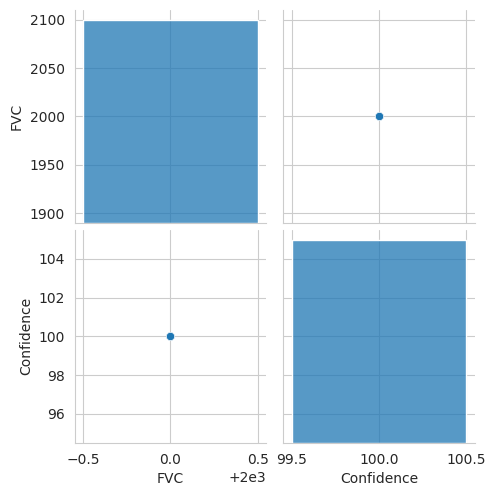

In [43]:
df_preds = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/sample_submission.csv")
df_preds.columns=df_preds.columns.to_series().apply(lambda x:x.strip())

def plot_fvc_metric_model(actual_fvc, predicted_fvc, predicted_confidence, constant = False):
    """
    Generatings a bokeh plot for the metric values across actual values of FVC.
    """
    lll = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence)
    metric_values = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence, return_values = True)

    df = pd.DataFrame({
        "actual_FVC": actual_fvc,
        "predicted_FVC": predicted_fvc,
        "confidence": predicted_confidence,
        "metric": metric_values
    }).sort_values("actual_FVC")
    
    source = ColumnDataSource(df)
    
    tooltips = [
        ("Actual FVC", "@actual_FVC{0}"),
        ("Predicted FVC", "@predicted_FVC{0}"),
        ("Confidence", "@confidence{0}"),
        ("Metric", "@metric{0.000}")
    ]
    
    if type(predicted_confidence) != int:
        title = f"Metric values over FVC"
        offset = 0.35
    else:
        title = f"Metric values over FVC (Confidence = {predicted_confidence})"
        offset = 0.11
    
    v = figure(
        plot_width = 600,
        plot_height = 600,
        y_range = Range1d(max(metric_values) + 0.5, min(metric_values) - 0.5),
        tooltips = tooltips,
        title = title
    )

    v.circle("actual_FVC", "metric", source = source, size = 3, color = "mediumseagreen", alpha = 0.8)
    
    mean = Span(
        location = lll,
        dimension = "width",
        line_color = "red",
        line_dash = "dashed",
        line_width = 1.5
    )

    v.add_layout(mean)
    
    score = Label(
        x = 3750,
        y = lll + offset,
        text = f"Laplace Log Likelihood = {round(lll, 3)}",
        text_font_size = "12pt"
    )

    v.add_layout(score)
    
    v.xaxis.axis_label = "Actual FVC"
    v.yaxis.axis_label = "Metric Value"

    return v


def plot_confidence_metric_model(actual_fvc, predicted_fvc, predicted_confidence):
    """
    Generatings a bokeh plot for the metric values across predicted values of confidence.
    """
    lll = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence)
    metric_values = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence, return_values = True)

    df = pd.DataFrame({
        "actual_FVC": actual_fvc,
        "predicted_FVC": predicted_fvc,
        "confidence": predicted_confidence,
        "metric": metric_values
    }).sort_values("confidence")
    
    source = ColumnDataSource(df)
    
    tooltips = [
        ("Actual FVC", "@actual_FVC{0}"),
        ("Predicted FVC", "@predicted_FVC{0}"),
        ("Confidence", "@confidence{0}"),
        ("Metric", "@metric{0.000}")
    ]
    
    v = figure(
        plot_width = 600,
        plot_height = 600,
        y_range = Range1d(max(metric_values) + 0.5, min(metric_values) - 0.5),
        tooltips = tooltips,
        title = "Metric values over Confidence"
    )

    v.circle("confidence", "metric", source = source, size = 3, color = "gold", alpha = 0.8)
    
    mean = Span(
        location = lll,
        dimension = "width",
        line_color = "red",
        line_dash = "dashed",
        line_width = 1.5
    )

    v.add_layout(mean)
    
    score = Label(
        x = 600,
        y = lll + 0.35,
        text = f"Laplace Log Likelihood = {round(lll, 3)}",
        text_font_size = "12pt"
    )

    v.add_layout(score)
    
    v.xaxis.axis_label = "Predicted Confidence"
    v.yaxis.axis_label = "Metric Value"

    return v


def plot_pred_metric_model(actual_fvc, predicted_fvc, predicted_confidence):
    """
    Generatings a bokeh plot for the metric values across predicted values of FVC.
    """
    lll = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence)
    metric_values = laplace_log_likelihood(actual_fvc, predicted_fvc, predicted_confidence, return_values = True)

    df = pd.DataFrame({
        "actual_FVC": actual_fvc,
        "predicted_FVC": predicted_fvc,
        "confidence": predicted_confidence,
        "metric": metric_values
    }).sort_values("predicted_FVC")
    
    source = ColumnDataSource(df)
    
    tooltips = [
        ("Actual FVC", "@actual_FVC{0}"),
        ("Predicted FVC", "@predicted_FVC{0}"),
        ("Confidence", "@confidence{0}"),
        ("Metric", "@metric{0.000}")
    ]
    
    v = figure(
        plot_width = 600,
        plot_height = 600,
        y_range = Range1d(max(metric_values) + 0.5, min(metric_values) - 0.5),
        tooltips = tooltips,
        title = "Metric values over predicted FVC"
    )

    v.circle("predicted_FVC", "metric", source = source, size = 3, color = "turquoise", alpha = 0.8)
    
    mean = Span(
        location = lll,
        dimension = "width",
        line_color = "red",
        line_dash = "dashed",
        line_width = 1.5
    )

    v.add_layout(mean)
    
    score = Label(
        x = 3500,
        y = lll + 0.35,
        text = f"Laplace Log Likelihood = {round(lll, 3)}",
        text_font_size = "12pt"
    )

    v.add_layout(score)
    
    v.xaxis.axis_label = "Predicted FVC"
    v.yaxis.axis_label = "Metric Value"

    return v


sns.pairplot(df_preds[["FVC", "Confidence"]]);

In [44]:
'''''
#v1 = plot_fvc_metric_model(df_preds.FVC,df_preds.Confidence)
v2 = plot_fvc_metric_model(df_preds.FVC, df_preds.FVC, 833)

show(column(v1, v2))
'''''

"''\n#v1 = plot_fvc_metric_model(df_preds.FVC,df_preds.Confidence)\nv2 = plot_fvc_metric_model(df_preds.FVC, df_preds.FVC, 833)\n\nshow(column(v1, v2))\n"

In [45]:
'''
v1 = plot_confidence_metric_model(df_preds.FVC, df_preds.FVC_pred, df_preds.Confidence)
v2 = plot_pred_metric_model(df_preds.FVC, df_preds.FVC_pred, df_preds.Confidence)

show(column(v1, v2))
'''

'\nv1 = plot_confidence_metric_model(df_preds.FVC, df_preds.FVC_pred, df_preds.Confidence)\nv2 = plot_pred_metric_model(df_preds.FVC, df_preds.FVC_pred, df_preds.Confidence)\n\nshow(column(v1, v2))\n'

# using rmse and mse as metrics

In [46]:
import os
from tqdm import tqdm

       
import numpy as np
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
import math
from torch.nn import TransformerEncoder, TransformerEncoderLayer

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [47]:
Path = "../input/osic-pulmonary-fibrosis-progression"
df_train= pd.read_csv(f"{Path}/train.csv")
df_train.drop_duplicates(keep=False, inplace=True,subset=['Patient','Weeks'])
df_test= pd.read_csv(f"{Path}/test.csv")
Patient_list= df_train["Patient"].unique()

In [48]:
df_train

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker
...,...,...,...,...,...,...,...
1544,ID00426637202313170790466,13,2712,66.594637,73,Male,Never smoked
1545,ID00426637202313170790466,19,2978,73.126412,73,Male,Never smoked
1546,ID00426637202313170790466,31,2908,71.407524,73,Male,Never smoked
1547,ID00426637202313170790466,43,2975,73.052745,73,Male,Never smoked


In [49]:
df_test

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker
1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker
2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker
3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker
4,ID00426637202313170790466,0,2925,71.824968,73,Male,Never smoked


In [50]:
for patient, group in df_train.groupby('Patient'):
    print(f"Patient {patient}: Weeks values {group['Weeks'].tolist()}")

Patient ID00007637202177411956430: Weeks values [-4, 5, 7, 9, 11, 17, 29, 41, 57]
Patient ID00009637202177434476278: Weeks values [8, 9, 11, 13, 15, 22, 33, 45, 60]
Patient ID00010637202177584971671: Weeks values [0, 1, 3, 5, 7, 13, 25, 37, 54]
Patient ID00011637202177653955184: Weeks values [6, 7, 9, 11, 13, 19, 32, 43, 58]
Patient ID00012637202177665765362: Weeks values [33, 35, 37, 39, 41, 47, 58, 71, 87]
Patient ID00014637202177757139317: Weeks values [0, 2, 4, 6, 8, 14, 26, 37, 54]
Patient ID00015637202177877247924: Weeks values [12, 17, 19, 21, 31, 40, 52, 69]
Patient ID00019637202178323708467: Weeks values [13, 14, 16, 18, 20, 26, 38, 53, 66]
Patient ID00020637202178344345685: Weeks values [18, 19, 21, 23, 25, 31, 44, 54, 70]
Patient ID00023637202179104603099: Weeks values [-3, 3, 5, 7, 9, 15, 27, 39, 55]
Patient ID00025637202179541264076: Weeks values [0, 1, 3, 6, 7, 14, 26, 38, 53]
Patient ID00026637202179561894768: Weeks values [41, 45, 47, 49, 51, 57, 69, 81, 98]
Patient ID0

In [51]:
df_train.groupby('Patient').size()

Patient
ID00007637202177411956430    9
ID00009637202177434476278    9
ID00010637202177584971671    9
ID00011637202177653955184    9
ID00012637202177665765362    9
                            ..
ID00419637202311204720264    9
ID00421637202311550012437    8
ID00422637202311677017371    8
ID00423637202312137826377    9
ID00426637202313170790466    9
Length: 176, dtype: int64

In [52]:
datapoints_per_patient = df_train.groupby('Patient').size()

# Filter to get patients with less than 7 datapoints.
patients_with_less_than_7 = datapoints_per_patient[datapoints_per_patient < 7]

# Count the number of such patients.
number_of_patients = patients_with_less_than_7.count()

print(f'Number of patients with less than 7 datapoints: {number_of_patients}')

Number of patients with less than 7 datapoints: 3


In [53]:
df_train = df_train.groupby('Patient').filter(lambda x: len(x) >= 7)

In [54]:
datapoints_per_patient = df_train.groupby('Patient').size()

# Filter to get patients with less than 7 datapoints.
patients_with_less_than_7 = datapoints_per_patient[datapoints_per_patient < 7]

# Count the number of such patients.
number_of_patients = patients_with_less_than_7.count()

print(f'Number of patients with less than 7 datapoints: {number_of_patients}')

Number of patients with less than 7 datapoints: 0


In [55]:
def Seven(group):
    if len(group) > 7:
        return group.iloc[-7:]  # Selects the last 7 rows
    return group

In [56]:
import numpy as np
import itertools
import pandas as pd

from itertools import combinations

def select_evenly_spaced_points(df_group, num_points=7):
    weeks = df_group['Weeks'].tolist()
    
    if len(weeks) <= num_points:
        return df_group

    best_combination = None
    best_std = float('inf')

    for combination in combinations(weeks, num_points):
        intervals = np.diff(sorted(combination))
        std = np.std(intervals)

        if std < best_std:
            best_std = std
            best_combination = combination

    # Ensure that best_combination is not None and has unique points
    if best_combination and len(set(best_combination)) == num_points:
        return df_group[df_group['Weeks'].isin(best_combination)]
    else:
        # Fallback: select points with maximum intervals between them
        sorted_weeks = sorted(weeks)
        selected_indices = [0]  # Always include the first point
        interval = len(sorted_weeks) // (num_points - 1)

        for i in range(1, num_points - 1):
            selected_indices.append(i * interval)
        selected_indices.append(len(sorted_weeks) - 1)  # Always include the last point

        return df_group[df_group['Weeks'].isin([sorted_weeks[i] for i in selected_indices])]

In [57]:
df_train = df_train.groupby('Patient').apply(select_evenly_spaced_points).reset_index(drop=True)

In [58]:
all_have_seven = all(df_train.groupby('Patient').size() == 7)
print(f'Do all patients have exactly 7 datapoints? {all_have_seven}')

Do all patients have exactly 7 datapoints? True


In [59]:
def process_patient_group(df_group):
    df_group = df_group.sort_values(by='Weeks')
    patient_data = {
        'Patient': df_group['Patient'].iloc[0],
        'Weeks': ','.join(df_group['Weeks'].astype(str)),
        'Percent': ','.join(df_group['Percent'].astype(str)),
        'FVC': ','.join(df_group['FVC'].astype(str)),
        'Age': df_group['Age'].iloc[0], 
        'Sex': df_group['Sex'].iloc[0],  
        'SmokingStatus': df_group['SmokingStatus'].iloc[0]  # Assuming smoking status is constant for all rows of the same patient
    }
    return pd.Series(patient_data)

In [60]:
processed_df = df_train.groupby('Patient').apply(process_patient_group).reset_index(drop=True)

In [61]:
processed_df.head(7)

,Patient,Weeks,Percent,FVC,Age,Sex,SmokingStatus
0,ID00007637202177411956430,"-4,5,11,17,29,41,57","58.2536487166583,55.7121288374434,52.063412179...","2315,2214,2069,2101,2000,2064,2057",79,Male,Ex-smoker
1,ID00009637202177434476278,"8,9,11,13,15,22,33","85.2828781806319,84.11781153882,90.75869139714...","3660,3610,3895,3759,3639,3578,3625",69,Male,Ex-smoker
2,ID00010637202177584971671,"0,1,3,5,7,13,25","94.7246719724672,90.6915465691547,89.454721445...","3523,3373,3327,2993,3030,3103,2993",60,Male,Ex-smoker
3,ID00011637202177653955184,"6,7,9,11,13,19,32","85.9875904860393,88.3919338159255,91.546018614...","3326,3419,3541,3502,3410,3477,3269",72,Male,Ex-smoker
4,ID00012637202177665765362,"33,35,37,39,41,47,58","93.7260063617418,103.076669957223,89.832181638...","3418,3759,3276,3443,3268,3449,3324",65,Male,Never smoked
5,ID00014637202177757139317,"0,2,4,6,8,14,26","90.076660988075,92.206132879046,85.53378762067...","3807,3897,3615,3786,3756,3238,3221",56,Male,Ex-smoker
6,ID00015637202177877247924,"12,17,19,21,31,40,52","78.6452947259566,80.6618407445708,74.715615305...","3042,3120,2890,2667,2968,2697,2682",71,Male,Ex-smoker


In [62]:
# Assuming 'processed_df' is your preprocessed DataFrame
percent_values = processed_df['Percent'].apply(lambda x: np.fromstring(x, dtype=float, sep=','))
min_percent_values = percent_values.apply(min)

# Check if any percent value is less than 0
if (min_percent_values < 0).any():
    print("There are percent values less than 0.")
else:
    print("All percent values are greater than or equal to 0.")

All percent values are greater than or equal to 0.


In [63]:
import pydicom
from tqdm import tqdm
from PIL import Image

def preprocess_ct_images(patient_list, data_type="train", image_size=(128, 128), show_first_image=False):
    x = []
    for patient in tqdm(patient_list):
        image_dir = f"{Path}/{data_type}/{patient}"
        week = df_train[df_train["Patient"] == patient]["Weeks"]
        image_count = 0  # Initialize a counter for the number of images
        for i, w in enumerate(week):
            try:
                ds = pydicom.dcmread(os.path.join(image_dir, f"{w}.dcm"))
                im = Image.fromarray(ds.pixel_array)
                im = im.resize(image_size, resample=Image.NEAREST)
                im_array = np.array(im).reshape((*image_size, 1))  # Grayscale image
                im_array = im_array / 255.0  # Normalization
                x.append(im_array)
                image_count += 1  # Increment the counter
                
            except Exception as e:
                print(f"{e}")
        print(f"Patient {patient} has {image_count} images.")  # Print the total number of images found for each patient
    return np.array(x)

# Preprocess CT scan images
x_train = preprocess_ct_images(Patient_list, "train", show_first_image=True)

  4%|▍         | 7/176 [00:00<00:04, 35.38it/s]

[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/-4.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/41.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/57.dcm'
Patient ID00007637202177411956430 has 4 images.
Patient ID00009637202177434476278 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00010637202177584971671/0.dcm'
Patient ID00010637202177584971671 has 6 images.
The following handlers are available to decode the pixel data however they are missing required dependencies: GDCM (req. GDCM), pylibjpeg (req. )
The following handlers are available to decode the pixel data however they are missing required dependencies: GDCM (req. GDCM), pylibjpeg (req. )
The following handlers are available to decode the pixel data however the

  6%|▋         | 11/176 [00:00<00:04, 34.93it/s]

[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00019637202178323708467/38.dcm'
Patient ID00019637202178323708467 has 6 images.
Patient ID00020637202178344345685 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00023637202179104603099/-3.dcm'
Patient ID00023637202179104603099 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00025637202179541264076/0.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00025637202179541264076/26.dcm'
Patient ID00025637202179541264076 has 5 images.
Patient ID00026637202179561894768 has 7 images.
Patient ID00027637202179689871102 has 7 images.
Patient ID00030637202181211009029 has 7 images.


 11%|█▏        | 20/176 [00:00<00:04, 38.38it/s]

Patient ID00032637202181710233084 has 7 images.
Patient ID00035637202182204917484 has 7 images.
Patient ID00038637202182690843176 has 7 images.
Patient ID00042637202184406822975 has 7 images.
Patient ID00047637202184938901501 has 0 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00048637202185016727717/33.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00048637202185016727717/47.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00048637202185016727717/61.dcm'
Patient ID00048637202185016727717 has 4 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00051637202185848464638/-1.dcm'
Patient ID00051637202185848464638 has 6 images.
Patient ID00052637202186188008618 has 7 images.
Patient ID00060637202187965290703 has 7 images.


 16%|█▌        | 28/176 [00:00<00:03, 37.70it/s]

Patient ID00061637202188184085559 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/44.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/46.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/48.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/50.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/52.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/58.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00062637202188654068490/70.dcm'
Patient ID00062637202188654068490 has 0 images.
Patient ID00067637202189903532242 has 7 ima

 20%|██        | 36/176 [00:00<00:03, 37.91it/s]

Patient ID00077637202199102000916 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00078637202199415319443/0.dcm'
Patient ID00078637202199415319443 has 6 images.
Patient ID00082637202201836229724 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00086637202203494931510/-5.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00086637202203494931510/42.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00086637202203494931510/58.dcm'
Patient ID00086637202203494931510 has 4 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00089637202204675567570/44.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00089637202204675567570/60.dcm'
Patient ID00089637202204675567570 has 5 images.
[Errno 2] No such file 

 27%|██▋       | 47/176 [00:01<00:03, 42.31it/s]

Patient ID00104637202208063407045 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00105637202208831864134/57.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00105637202208831864134/69.dcm'
Patient ID00105637202208831864134 has 5 images.
Patient ID00108637202209619669361 has 7 images.
Patient ID00109637202210454292264 has 7 images.
Patient ID00110637202210673668310 has 7 images.
Patient ID00111637202210956877205 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00115637202211874187958/29.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00115637202211874187958/42.dcm'
Patient ID00115637202211874187958 has 5 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00117637202212360228007/32.dcm'
Patient ID00117637202212360228007 has 6 images.
P

 34%|███▎      | 59/176 [00:01<00:02, 49.02it/s]

Patient ID00122637202216437668965 has 6 images.
Patient ID00123637202217151272140 has 7 images.
Patient ID00124637202217596410344 has 7 images.
Patient ID00125637202218590429387 has 0 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/18.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/26.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/32.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/38.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/50.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00126637202218610655908/62.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis

 39%|███▉      | 69/176 [00:01<00:02, 47.49it/s]

Patient ID00134637202223873059688 has 7 images.
Patient ID00135637202224630271439 has 7 images.
Patient ID00136637202224951350618 has 7 images.
Patient ID00138637202231603868088 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00139637202231703564336/73.dcm'
Patient ID00139637202231703564336 has 6 images.
Patient ID00140637202231728595149 has 7 images.
Patient ID00149637202232704462834 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00161637202235731948764/34.dcm'
Patient ID00161637202235731948764 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00165637202237320314458/79.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00165637202237320314458/81.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00165637202237320314458/83.dcm'
[

 46%|████▌     | 81/176 [00:01<00:01, 48.35it/s]

Patient ID00169637202238024117706 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/38.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/44.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/46.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/50.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/56.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00170637202238079193844/68.dcm'
Patient ID00170637202238079193844 has 1 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00172637202238316925179/35.dcm'
[Errno 2] No such file or directory: '../in

 52%|█████▏    | 91/176 [00:02<00:01, 47.09it/s]

Patient ID00196637202246668775836 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00197637202246865691526/0.dcm'
Patient ID00197637202246865691526 has 6 images.
Patient ID00199637202248141386743 has 7 images.
Patient ID00202637202249376026949 has 7 images.
Patient ID00207637202252526380974 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00210637202257228694086/0.dcm'
Patient ID00210637202257228694086 has 6 images.
Patient ID00213637202257692916109 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00214637202257820847190/28.dcm'
Patient ID00214637202257820847190 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00216637202257988213445/23.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00216637202257988213445/34.dcm'
Pat

 59%|█████▊    | 103/176 [00:02<00:01, 49.76it/s]

Patient ID00219637202258203123958 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00221637202258717315571/36.dcm'
Patient ID00221637202258717315571 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00222637202259066229764/-1.dcm'
Patient ID00222637202259066229764 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00224637202259281193413/0.dcm'
Patient ID00224637202259281193413 has 6 images.
Patient ID00225637202259339837603 has 7 images.
Patient ID00228637202259965313869 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00229637202260254240583/23.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00229637202260254240583/26.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID0022963

 65%|██████▌   | 115/176 [00:02<00:01, 52.30it/s]

[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00240637202264138860065/41.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00240637202264138860065/57.dcm'
Patient ID00240637202264138860065 has 5 images.
Patient ID00241637202264294508775 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00242637202264759739921/28.dcm'
Patient ID00242637202264759739921 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00248637202266698862378/17.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00248637202266698862378/19.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00248637202266698862378/20.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00248637202266698862378/27.

 69%|██████▉   | 121/176 [00:02<00:01, 48.91it/s]

[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00276637202271694539978/31.dcm'
Patient ID00276637202271694539978 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00279637202272164826258/34.dcm'
Patient ID00279637202272164826258 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00283637202278714365037/0.dcm'
Patient ID00283637202278714365037 has 6 images.
Patient ID00285637202278913507108 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00288637202279148973731/28.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00288637202279148973731/34.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00288637202279148973731/45.dcm'
Patient ID00288637202279148973731 has 4 images.
Patient ID0029063720227

 74%|███████▍  | 131/176 [00:02<00:00, 47.56it/s]

Patient ID00299637202280383305867 has 7 images.
Patient ID00305637202281772703145 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00307637202282126172865/31.dcm'
Patient ID00307637202282126172865 has 6 images.
Patient ID00309637202282195513787 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00312637202282607344793/0.dcm'
Patient ID00312637202282607344793 has 6 images.
Patient ID00317637202283194142136 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00319637202283897208687/40.dcm'
Patient ID00319637202283897208687 has 6 images.
Patient ID00322637202284842245491 has 7 images.
Patient ID00323637202285211956970 has 7 images.
Patient ID00329637202285906759848 has 7 images.


 80%|████████  | 141/176 [00:03<00:00, 47.65it/s]

Patient ID00331637202286306023714 has 7 images.
Patient ID00335637202286784464927 has 7 images.
Patient ID00336637202286801879145 has 7 images.
Patient ID00337637202286839091062 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00339637202287377736231/0.dcm'
Patient ID00339637202287377736231 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00340637202287399835821/-1.dcm'
Patient ID00340637202287399835821 has 6 images.
Patient ID00341637202287410878488 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00342637202287526592911/29.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00342637202287526592911/31.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00342637202287526592911/37.dcm'
[Errno 2] No such file or directory: '../input/osi

 86%|████████▋ | 152/176 [00:03<00:00, 49.78it/s]

[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00351637202289476567312/39.dcm'
Patient ID00351637202289476567312 has 6 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00355637202295106567614/40.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00355637202295106567614/52.dcm'
Patient ID00355637202295106567614 has 5 images.
Patient ID00358637202295388077032 has 7 images.
Patient ID00360637202295712204040 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00364637202296074419422/37.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00364637202296074419422/41.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00364637202296074419422/43.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis

 93%|█████████▎| 163/176 [00:03<00:00, 50.73it/s]

Patient ID00378637202298597306391 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/5.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/7.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/9.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/11.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/13.dcm'
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00381637202299644114027/19.dcm'
Patient ID00381637202299644114027 has 1 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00383637202300493233675/48.dcm'
[Errno 2] No such file or directory: '../input

100%|██████████| 176/176 [00:03<00:00, 45.99it/s]

Patient ID00411637202309374271828 has 7 images.
Patient ID00414637202310318891556 has 7 images.
Patient ID00417637202310901214011 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00419637202311204720264/31.dcm'
Patient ID00419637202311204720264 has 6 images.
Patient ID00421637202311550012437 has 7 images.
Patient ID00422637202311677017371 has 7 images.
Patient ID00423637202312137826377 has 7 images.
[Errno 2] No such file or directory: '../input/osic-pulmonary-fibrosis-progression/train/ID00426637202313170790466/0.dcm'
Patient ID00426637202313170790466 has 6 images.


In [64]:
import tensorflow as tf
from tensorflow.keras import layers as L
from tensorflow.keras import models as M

def extract_image_features():
    ct = L.Input((128, 128, 1), name="Ctinput")
    x = L.Conv2D(64, (6, 6), activation="relu", name="conv1")(ct)
    x = L.MaxPooling2D(pool_size=(3, 3), name='pool1')(x)
    x = L.Conv2D(64, (6, 6), activation="relu", name="conv2")(x)
    x = L.MaxPooling2D(pool_size=(3, 3), name='pool2')(x)
    x = L.Conv2D(128, (6, 6), activation="relu", name="conv3")(x)
    x = L.MaxPooling2D(pool_size=(2, 2), name='pool3')(x)
    x = L.Flatten(name="features")(x)
    model = M.Model(ct, x, name="ImageFeatureExtractor")
    return model

# Instantiate the image feature extractor
image_feature_extractor = extract_image_features()
print(image_feature_extractor.summary())

# Extract image features from the training data
image_features = image_feature_extractor.predict(x_train, batch_size=50, verbose=1)

2024-04-23 06:29:10.225066: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 06:29:10.225222: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 06:29:10.354715: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Model: "ImageFeatureExtractor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Ctinput (InputLayer)            │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 123, 123, 64)   │         2,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 41, 41, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 36, 36, 64)     │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 7, 7, 128)      │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ features (Flatten)              │ (None, 1152)           │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 444,928 (1.70 MB)

 Trainable params: 444,928 (1.70 MB)

 Non-trainable params: 0 (0.00 B)

None
17/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

I0000 00:00:1713853764.119291      89 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


In [65]:
print(image_feature_extractor.summary())
print(image_features.shape)

Model: "ImageFeatureExtractor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Ctinput (InputLayer)            │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 123, 123, 64)   │         2,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 41, 41, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 36, 36, 64)     │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 7, 7, 128)      │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ features (Flatten)              │ (None, 1152)           │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 444,928 (1.70 MB)

 Trainable params: 444,928 (1.70 MB)

 Non-trainable params: 0 (0.00 B)

None
(1025, 1152)


In [66]:
# Assuming 'processed_df' is your preprocessed DataFrame
processed_df = df_train.groupby('Patient').apply(process_patient_group).reset_index(drop=True)

# Duplicate the dataframe and add a suffix to the patient IDs
duplicated_df = processed_df.copy()
duplicated_df['Patient'] = duplicated_df['Patient'] + '_dup'

# Concatenate the original and duplicated dataframes
augmented_df = pd.concat([processed_df, duplicated_df], ignore_index=True)


In [67]:
from torch.utils.data import Dataset
import numpy as np
import torch
from sklearn.preprocessing import MinMaxScaler

class FVCDataset(Dataset):
    def __init__(self, dataframe):
        fvc_values = [np.fromstring(row['FVC'], dtype=float, sep=',') for _, row in dataframe.iterrows()]
        self.scaler = MinMaxScaler()
        # Reshape to fit the scaler properly
        self.fvc_values = self.scaler.fit_transform(np.array(fvc_values).reshape(-1, 1)).reshape(-1, 7)

    def __len__(self):
        return len(self.fvc_values)

    def __getitem__(self, idx):
        fvc = torch.tensor(self.fvc_values[idx][:5], dtype=torch.float32)  # First 5 FVC values as input
        target = torch.tensor(self.fvc_values[idx][-2:], dtype=torch.float32)  # Last 2 FVC values as target
        return fvc, target

    def inverse_transform(self, scaled_fvc):
        return self.scaler.inverse_transform(scaled_fvc)

# Now you can proceed to create the dataset and split it into training and validation sets
dataset = FVCDataset(augmented_df)


In [68]:
print(processed_df['Age'].unique())
print(processed_df['SmokingStatus'].unique())
print(processed_df['Sex'].unique())

[79 69 60 72 65 56 71 83 66 57 73 63 58 70 54 68 74 64 52 51 55 49 77 78
 87 61 67 76 62 81 88 75 59 53]
['Ex-smoker' 'Never smoked' 'Currently smokes']
['Male' 'Female']


In [69]:
# Generate indices: an array of integers from 0 to the length of the dataset - 1
dataset_indices = [i for i in range(len(dataset))]

# Split indices into training and validation sets
train_indices, val_indices, _, _ = train_test_split(dataset_indices, dataset_indices, test_size=0.2, random_state=42)

# Create subsets for training and validation using Subset
from torch.utils.data import Subset

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)



class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, d_model)
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1), :]
        return self.dropout(x)

    
    
    
import torch
import torch.nn as nn

class FVCTransformer(nn.Module):
    def __init__(self, fvc_input_dim, output_dim):
        super(FVCTransformer, self).__init__()
        self.fvc_linear = nn.Linear(fvc_input_dim, 64)
        self.output_linear = nn.Linear(64, output_dim)

    def forward(self, fvc):
        fvc_output = self.fvc_linear(fvc)
        output = self.output_linear(fvc_output)
        return output

fvc_input_dim = 5  # Only 5 FVC values as input
output_dim = 2  # Predicting the last 2 FVC values
model = FVCTransformer(fvc_input_dim, output_dim)


fvc_input_dim = 5  # Only 5 FVC values as input
output_dim = 2  # Predicting the last 2 FVC values
model = FVCTransformer(fvc_input_dim, output_dim)


In [70]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=20):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        total_train_loss = 0
        correct_train_predictions = 0

        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

            # Calculate accuracy for training
            train_accuracy = torch.mean(((torch.abs(targets - outputs) / targets) < 0.15).float()).item()
            correct_train_predictions += train_accuracy * len(targets)

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        train_accuracies.append(correct_train_predictions / len(train_loader.dataset))

        model.eval()
        total_val_loss = 0
        correct_val_predictions = 0

        with torch.no_grad():
            for inputs, targets in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                total_val_loss += loss.item()

                # Calculate accuracy for validation
                val_accuracy = torch.mean(((torch.abs(targets - outputs) / targets) < 0.15).float()).item()
                correct_val_predictions += val_accuracy * len(targets)

        avg_val_loss = total_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        val_accuracies.append(correct_val_predictions / len(val_loader.dataset))

        print(f'Epoch {epoch+1}, Training Loss: {avg_train_loss}, Validation Loss: {avg_val_loss}, '
              f'Training Accuracy: {train_accuracies[-1]:.2f}, Validation Accuracy: {val_accuracies[-1]:.2f}')

    # Plot the training and validation losses and accuracies
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Epoch vs. Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Epoch vs. Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return train_losses, val_losses, train_accuracies, val_accuracies


Epoch 1, Training Loss: 0.02350303833372891, Validation Loss: 0.006329014564731291, Training Accuracy: 0.35, Validation Accuracy: 0.49
Epoch 2, Training Loss: 0.004289689186927197, Validation Loss: 0.0018324742309882172, Training Accuracy: 0.59, Validation Accuracy: 0.80
Epoch 3, Training Loss: 0.0020903495689188795, Validation Loss: 0.001299768445148532, Training Accuracy: 0.71, Validation Accuracy: 0.82
Epoch 4, Training Loss: 0.0016184578645541997, Validation Loss: 0.001149995277436184, Training Accuracy: 0.77, Validation Accuracy: 0.86
Epoch 5, Training Loss: 0.0014275626059056126, Validation Loss: 0.0011869099648070655, Training Accuracy: 0.80, Validation Accuracy: 0.84
Epoch 6, Training Loss: 0.001458932741245787, Validation Loss: 0.0012236698447460575, Training Accuracy: 0.80, Validation Accuracy: 0.85
Epoch 7, Training Loss: 0.0014485797811565654, Validation Loss: 0.0014749245934321412, Training Accuracy: 0.79, Validation Accuracy: 0.84
Epoch 8, Training Loss: 0.001601561737645

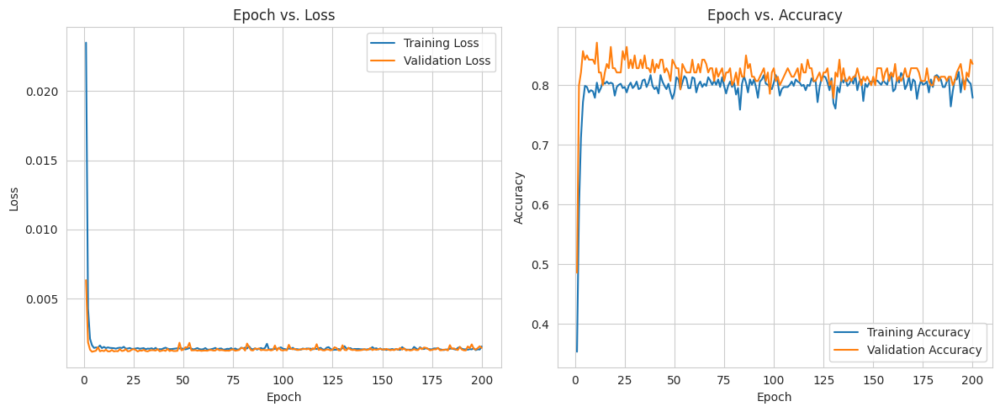

In [71]:
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Start with a learning rate of 0.001

# You can try different learning rates to see which one works best for your model
# For example:
# optimizer = optim.Adam(model.parameters(), lr=0.0001)  # Decrease the learning rate if needed

# Train the model and plot the loss and accuracy
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=200)


In [72]:
from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def evaluate_model(model, dataloader, scaler):
    model.eval()  # Put the model in evaluation mode
    
    predictions, actuals = [], []
    
    with torch.no_grad():
        for inputs, targets in dataloader:
            outputs = model(inputs)
            outputs = outputs.squeeze(-1)  # Adjust dimensions if necessary
            
            # Select only the last output for comparison
            predicted_fvc = outputs.detach().cpu().numpy()
            actual_fvc = targets.detach().cpu().numpy()
            
            # Unscale the predictions and actual values
            predicted_fvc = scaler.inverse_transform(predicted_fvc.reshape(-1, 1)).flatten()
            actual_fvc = scaler.inverse_transform(actual_fvc.reshape(-1, 1)).flatten()
            
            predictions.extend(predicted_fvc)
            actuals.extend(actual_fvc)
    
    predictions = np.array(predictions)
    actuals = np.array(actuals)
    
    # Calculate metrics
    mae = mean_absolute_error(actuals, predictions)
    rmse = mean_squared_error(actuals, predictions, squared=False)  # Pass squared=False for RMSE
    r2 = r2_score(actuals, predictions)
    pearson_corr = pearsonr(predictions, actuals)[0]
    
    return mae, rmse, r2, pearson_corr





scaler = dataset.scaler  # Assuming 'dataset' is an instance of FVCDataset
mae, rmse, r2, pearson_corr = evaluate_model(model, val_loader, scaler)
print(f"Validation MAE: {mae}, Validation RMSE: {rmse}, Validation R^2: {r2}, Validation Pearson Correlation: {pearson_corr}")

Validation MAE: 138.66796875, Validation RMSE: 210.359619140625, Validation R^2: 0.9258998181755271, Validation Pearson Correlation: 0.9677487576733962


# lgb baseline

In [73]:
import os
from logging import getLogger, INFO, StreamHandler, FileHandler, Formatter
from functools import partial

import random
import math

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, GroupKFold, KFold
from sklearn.metrics import mean_squared_error
import category_encoders as ce

from PIL import Image
import cv2
import pydicom

import torch

import lightgbm as lgb
from sklearn.linear_model import Ridge

import warnings
warnings.filterwarnings("ignore")

# utils

In [74]:
def get_logger(filename='log'):
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=f"{filename}.log")
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger

logger = get_logger()


def seed_everything(seed=777):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

# config

In [75]:
OUTPUT_DICT = './'

ID = 'Patient_Week'
TARGET = 'FVC'
SEED = 42
seed_everything(seed=SEED)

N_FOLD = 4

In [76]:
train = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/train.csv')
train[ID] = train['Patient'].astype(str) + '_' + train['Weeks'].astype(str)
print(train.shape)
train.head()

(1549, 8)


,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus,Patient_Week
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker,ID00007637202177411956430_-4
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker,ID00007637202177411956430_5
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker,ID00007637202177411956430_7
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker,ID00007637202177411956430_9
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker,ID00007637202177411956430_11


In [77]:

test = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/test.csv')\
        .rename(columns={'Weeks': 'base_Week', 'FVC': 'base_FVC', 'Percent': 'base_Percent', 'Age': 'base_Age'})
submission = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/sample_submission.csv')
submission['Patient'] = submission['Patient_Week'].apply(lambda x: x.split('_')[0])
submission['predict_Week'] = submission['Patient_Week'].apply(lambda x: x.split('_')[1]).astype(int)
test = submission.drop(columns=['FVC', 'Confidence']).merge(test, on='Patient')
test['Week_passed'] = test['predict_Week'] - test['base_Week']
print(test.shape)
test.head()

(730, 10)


,Patient_Week,Patient,predict_Week,base_Week,base_FVC,base_Percent,base_Age,Sex,SmokingStatus,Week_passed
0,ID00419637202311204720264_-12,ID00419637202311204720264,-12,6,3020,70.186855,73,Male,Ex-smoker,-18
1,ID00421637202311550012437_-12,ID00421637202311550012437,-12,15,2739,82.045291,68,Male,Ex-smoker,-27
2,ID00422637202311677017371_-12,ID00422637202311677017371,-12,6,1930,76.672493,73,Male,Ex-smoker,-18
3,ID00423637202312137826377_-12,ID00423637202312137826377,-12,17,3294,79.258903,72,Male,Ex-smoker,-29
4,ID00426637202313170790466_-12,ID00426637202313170790466,-12,0,2925,71.824968,73,Male,Never smoked,-12


In [78]:
submission = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/sample_submission.csv')
print(submission.shape)
submission.head()

(730, 3)


,Patient_Week,FVC,Confidence
0,ID00419637202311204720264_-12,2000,100
1,ID00421637202311550012437_-12,2000,100
2,ID00422637202311677017371_-12,2000,100
3,ID00423637202312137826377_-12,2000,100
4,ID00426637202313170790466_-12,2000,100


# prepare folds

In [79]:
folds = train[[ID, 'Patient', TARGET]].copy()
#Fold = KFold(n_splits=N_FOLD, shuffle=True, random_state=SEED)
Fold = GroupKFold(n_splits=N_FOLD)
groups = folds['Patient'].values
for n, (train_index, val_index) in enumerate(Fold.split(folds, folds[TARGET], groups)):
    folds.loc[val_index, 'fold'] = int(n)
folds['fold'] = folds['fold'].astype(int)
folds.head()

,Patient_Week,Patient,FVC,fold
0,ID00007637202177411956430_-4,ID00007637202177411956430,2315,2
1,ID00007637202177411956430_5,ID00007637202177411956430,2214,2
2,ID00007637202177411956430_7,ID00007637202177411956430,2061,2
3,ID00007637202177411956430_9,ID00007637202177411956430,2144,2
4,ID00007637202177411956430_11,ID00007637202177411956430,2069,2


# model

In [80]:
#===========================================================
# model
#===========================================================
def run_single_lightgbm(param, train_df, test_df, folds, features, target, fold_num=0, categorical=[]):
    
    trn_idx = folds[folds.fold != fold_num].index
    val_idx = folds[folds.fold == fold_num].index
    logger.info(f'len(trn_idx) : {len(trn_idx)}')
    logger.info(f'len(val_idx) : {len(val_idx)}')
    
    if categorical == []:
        trn_data = lgb.Dataset(train_df.iloc[trn_idx][features],
                               label=target.iloc[trn_idx])
        val_data = lgb.Dataset(train_df.iloc[val_idx][features],
                               label=target.iloc[val_idx])
    else:
        trn_data = lgb.Dataset(train_df.iloc[trn_idx][features],
                               label=target.iloc[trn_idx],
                               categorical_feature=categorical)
        val_data = lgb.Dataset(train_df.iloc[val_idx][features],
                               label=target.iloc[val_idx],
                               categorical_feature=categorical)

    oof = np.zeros(len(train_df))
    predictions = np.zeros(len(test_df))

    num_round = 10000

    clf = lgb.train(param,
                    trn_data,
                    num_round,
                    valid_sets=[trn_data, val_data],
                    verbose_eval=100,
                    early_stopping_rounds=100)

    oof[val_idx] = clf.predict(train_df.iloc[val_idx][features], num_iteration=clf.best_iteration)

    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = features
    fold_importance_df["importance"] = clf.feature_importance(importance_type='gain')
    fold_importance_df["fold"] = fold_num

    predictions += clf.predict(test_df[features], num_iteration=clf.best_iteration)
    
    # RMSE
    logger.info("fold{} RMSE score: {:<8.5f}".format(fold_num, np.sqrt(mean_squared_error(target[val_idx], oof[val_idx]))))
    
    return oof, predictions, fold_importance_df


def run_kfold_lightgbm(param, train, test, folds, features, target, n_fold=5, categorical=[]):
    
    logger.info(f"================================= {n_fold}fold lightgbm =================================")
    
    oof = np.zeros(len(train))
    predictions = np.zeros(len(test))
    feature_importance_df = pd.DataFrame()

    for fold_ in range(n_fold):
        print("Fold {}".format(fold_))
        _oof, _predictions, fold_importance_df = run_single_lightgbm(param,
                                                                     train,
                                                                     test,
                                                                     folds,
                                                                     features,
                                                                     target,
                                                                     fold_num=fold_,
                                                                     categorical=categorical)
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        oof += _oof
        predictions += _predictions / n_fold

    # RMSE
    logger.info("CV RMSE score: {:<8.5f}".format(np.sqrt(mean_squared_error(target, oof))))

    logger.info(f"=========================================================================================")
    
    return feature_importance_df, predictions, oof

    
def show_feature_importance(feature_importance_df, name):
    cols = (feature_importance_df[["Feature", "importance"]]
            .groupby("Feature")
            .mean()
            .sort_values(by="importance", ascending=False)[:50].index)
    best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]

    #plt.figure(figsize=(8, 16))
    plt.figure(figsize=(6, 4))
    sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('Features importance (averaged/folds)')
    plt.tight_layout()
    plt.savefig(OUTPUT_DICT+f'feature_importance_{name}.png')

# predict fvc

In [81]:
'''''
target = train[TARGET]
test[TARGET] = np.nan

# features
cat_features = ['Sex', 'SmokingStatus']
num_features = [c for c in test.columns if (test.dtypes[c] != 'object') & (c not in cat_features)]
features = num_features + cat_features
drop_features = [ID, TARGET, 'predict_Week', 'base_Week']
features = [c for c in features if c not in drop_features]

if cat_features:
    ce_oe = ce.OrdinalEncoder(cols=cat_features, handle_unknown='impute')
    ce_oe.fit(train)
    train = ce_oe.transform(train)
    test = ce_oe.transform(test)
        
lgb_param = {'objective': 'regression',
             'metric': 'rmse',
             'boosting_type': 'gbdt',
             'learning_rate': 0.01,
             'seed': SEED,
             'max_depth': -1,
             'verbosity': -1,
            }

feature_importance_df, predictions, oof = run_kfold_lightgbm(lgb_param, train, test, folds, features, target, 
                                                             n_fold=N_FOLD, categorical=cat_features)
    
show_feature_importance(feature_importance_df, TARGET)
'''''

"''\ntarget = train[TARGET]\ntest[TARGET] = np.nan\n\n# features\ncat_features = ['Sex', 'SmokingStatus']\nnum_features = [c for c in test.columns if (test.dtypes[c] != 'object') & (c not in cat_features)]\nfeatures = num_features + cat_features\ndrop_features = [ID, TARGET, 'predict_Week', 'base_Week']\nfeatures = [c for c in features if c not in drop_features]\n\nif cat_features:\n    ce_oe = ce.OrdinalEncoder(cols=cat_features, handle_unknown='impute')\n    ce_oe.fit(train)\n    train = ce_oe.transform(train)\n    test = ce_oe.transform(test)\n        \nlgb_param = {'objective': 'regression',\n             'metric': 'rmse',\n             'boosting_type': 'gbdt',\n             'learning_rate': 0.01,\n             'seed': SEED,\n             'max_depth': -1,\n             'verbosity': -1,\n            }\n\nfeature_importance_df, predictions, oof = run_kfold_lightgbm(lgb_param, train, test, folds, features, target, \n                                                             n_fold=N

In [82]:
#train['FVC_pred'] = ""
#test['FVC_pred'] = predictions

In [83]:
'''''
# baseline score
train['Confidence'] = 100
train['sigma_clipped'] = train['Confidence'].apply(lambda x: max(x, 70))
train['diff'] = abs(train['FVC'] - train['FVC_pred'])
train['delta'] = train['diff'].apply(lambda x: min(x, 1000))
train['score'] = -math.sqrt(2)*train['delta']/train['sigma_clipped'] - np.log(math.sqrt(2)*train['sigma_clipped'])
score = train['score'].mean()
print(score)
'''''

"''\n# baseline score\ntrain['Confidence'] = 100\ntrain['sigma_clipped'] = train['Confidence'].apply(lambda x: max(x, 70))\ntrain['diff'] = abs(train['FVC'] - train['FVC_pred'])\ntrain['delta'] = train['diff'].apply(lambda x: min(x, 1000))\ntrain['score'] = -math.sqrt(2)*train['delta']/train['sigma_clipped'] - np.log(math.sqrt(2)*train['sigma_clipped'])\nscore = train['score'].mean()\nprint(score)\n"

In [84]:
'''''
import scipy as sp

def loss_func(weight, row):
    confidence = weight
    sigma_clipped = max(confidence, 70)
    diff = abs(row['FVC'] - row['FVC_pred'])
    delta = min(diff, 1000)
    score = -math.sqrt(2)*delta/sigma_clipped - np.log(math.sqrt(2)*sigma_clipped)
    return -score

results = []
tk0 = tqdm(train.iterrows(), total=len(train))
for _, row in tk0:
    loss_partial = partial(loss_func, row=row)
    weight = [100]
    #bounds = [(70, 100)]
    #result = sp.optimize.minimize(loss_partial, weight, method='SLSQP', bounds=bounds)
    result = sp.optimize.minimize(loss_partial, weight, method='SLSQP')
    x = result['x']
    results.append(x[0])
'''''

"''\nimport scipy as sp\n\ndef loss_func(weight, row):\n    confidence = weight\n    sigma_clipped = max(confidence, 70)\n    diff = abs(row['FVC'] - row['FVC_pred'])\n    delta = min(diff, 1000)\n    score = -math.sqrt(2)*delta/sigma_clipped - np.log(math.sqrt(2)*sigma_clipped)\n    return -score\n\nresults = []\ntk0 = tqdm(train.iterrows(), total=len(train))\nfor _, row in tk0:\n    loss_partial = partial(loss_func, row=row)\n    weight = [100]\n    #bounds = [(70, 100)]\n    #result = sp.optimize.minimize(loss_partial, weight, method='SLSQP', bounds=bounds)\n    result = sp.optimize.minimize(loss_partial, weight, method='SLSQP')\n    x = result['x']\n    results.append(x[0])\n"

#  algorithm



In [85]:
'''''
# Importing necessary libraries
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")
# Assuming you have your features in X and the target variable (FVC) in y
# X should be a 2D array where each row represents a sample and each column represents a feature
# y should be a 1D array containing the target variable (FVC) values

# Splitting the dataset into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Converting the dataset into LightGBM Dataset format
train_data = lgb.Data(X_train, label=y_train)
test_data = lgb.Data(X_test, label=y_test)

# Parameters for LightGBM model
params = {
    'objective': 'regression',  # regression task
    'metric': 'rmse',           # evaluation metric
    'boosting': 'gbdt',         # gradient boosting decision tree
    'num_leaves': 31,           # maximum number of leaves in one tree
    'learning_rate': 0.05,      # learning rate
    'feature_fraction': 0.9,    # subsample ratio of features
    'bagging_fraction': 0.8,    # subsample ratio of data
    'bagging_freq': 5,          # frequency for bagging
    'verbose': 0                # no output when fitting the model
}

# Training the LightGBM model
num_round = 1000  # Number of boosting iterations
lgb_model = lgb.train(params, train_data, num_round, valid_sets=[test_data], early_stopping_rounds=50)

# Making predictions on the testing set
y_pred = lgb_model.predict(X_test, num_iteration=lgb_model.best_iteration)

# Evaluating the model
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("Root Mean Squared Error (RMSE):,",rmse)
'''''

'\'\'\n# Importing necessary libraries\nimport lightgbm as lgb\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.metrics import mean_squared_error\n\n\ndata = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")\n# Assuming you have your features in X and the target variable (FVC) in y\n# X should be a 2D array where each row represents a sample and each column represents a feature\n# y should be a 1D array containing the target variable (FVC) values\n\n# Splitting the dataset into training and testing sets\n\nX_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)\n\n# Converting the dataset into LightGBM Dataset format\ntrain_data = lgb.Data(X_train, label=y_train)\ntest_data = lgb.Data(X_test, label=y_test)\n\n# Parameters for LightGBM model\nparams = {\n    \'objective\': \'regression\',  # regression task\n    \'metric\': \'rmse\',           # evaluation metric\n    \'boosting\': \'gbdt\',         # gradient

# LGBM ALGORITHM

In [86]:
import pandas as pd
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder

# Load your data (replace with your path)
data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

# Convert categorical features into numerical format
label_encoders = {}
for feature in ["Patient", "Sex", "SmokingStatus"]:
    label_encoders[feature] = LabelEncoder()
    data[feature] = label_encoders[feature].fit_transform(data[feature])

# Separate features and target variable
features = data.drop("FVC", axis=1)  # Assuming "FVCrate" is the target
target = data["FVC"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Define LightGBM parameters (adjust as needed)
lgb_params = {
    "objective": "regression",
    "metric": ["l2", "l1", "l2_root"],  # Mean squared error, mean absolute error, root mean squared error
    "learning_rate": 0.1,
    "n_estimators": 100,  # Number of trees to grow
    "num_leaves": 31,  # Maximum number of leaves per tree
}

# Create and train the LightGBM model
model = LGBMRegressor(**lgb_params)
model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test)

# Evaluate model performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE) on testing set: {mse:.4f}")
print(f"Mean Absolute Error (MAE) on testing set: {mae:.4f}")
print(f"R-squared (R2) on testing set: {r2:.4f}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 1239, number of used features: 6
[LightGBM] [Info] Start training from score 2692.532688
Mean Squared Error (MSE) on testing set: 11734.1652
Mean Absolute Error (MAE) on testing set: 77.0056
R-squared (R2) on testing set: 0.9805


# SVM

In [87]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVR

# Load your data (replace with your path)
data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

# Convert categorical features into numerical format
label_encoders = {}
for feature in ["Patient", "Sex", "SmokingStatus"]:
    label_encoders[feature] = LabelEncoder()
    data[feature] = label_encoders[feature].fit_transform(data[feature])

# Separate features and target variable
features = data.drop("FVC", axis=1)  # Assuming "FVCrate" is the target
target = data["FVC"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Create and train the SVM model
svm_model = SVR(kernel='linear')
svm_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = svm_model.predict(X_test)

# Evaluate model performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE) on testing set: {mse:.4f}")
print(f"Mean Absolute Error (MAE) on testing set: {mae:.4f}")
print(f"R-squared (R2) on testing set: {r2:.4f}")


Mean Squared Error (MSE) on testing set: 294055.8732
Mean Absolute Error (MAE) on testing set: 374.5912
R-squared (R2) on testing set: 0.5110


# Random forest

In [88]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Load your data (replace with your path)
data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

# Convert FVC to discrete classes for classification
# You may need to adjust the binning strategy according to your data distribution
data['FVC_class'] = pd.qcut(data['FVC'], q=5, labels=False)

# Convert categorical features into numerical format
label_encoders = {}
for feature in ["Patient", "Sex", "SmokingStatus"]:
    label_encoders[feature] = LabelEncoder()
    data[feature] = label_encoders[feature].fit_transform(data[feature])

# Separate features and target variable
features = data.drop(["FVC", "FVC_class"], axis=1)  # Assuming "FVCrate" is the target
target = data["FVC_class"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Create and train the Random Forest Classifier model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = rf_model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy on testing set: {accuracy:.4f}")


Accuracy on testing set: 0.8806


# resnet

In [89]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Load your data (replace with your path)
data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

# Convert categorical features into numerical format
label_encoders = {}
for feature in ["Patient", "Sex", "SmokingStatus"]:
    label_encoders[feature] = LabelEncoder()
    data[feature] = label_encoders[feature].fit_transform(data[feature])

# Separate features and target variable
X = data.drop(["FVC"], axis=1)  # Assuming "FVCrate" is the target
y = data["FVC"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the ResNet-like neural network architecture
def residual_block(inputs, num_neurons):
    x = tf.keras.layers.Dense(num_neurons, activation='relu')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(num_neurons, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.add([inputs, x])
    x = tf.keras.layers.Activation('relu')(x)
    return x

inputs = tf.keras.layers.Input(shape=(X_train_scaled.shape[1],))
x = tf.keras.layers.Dense(64, activation='relu')(inputs)
x = tf.keras.layers.BatchNormalization()(x)

# Add residual blocks
for _ in range(3):  # Add 3 residual blocks
    x = residual_block(x, 64)

x = tf.keras.layers.Dense(1)(x)  # Output layer

model = tf.keras.Model(inputs=inputs, outputs=x)

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE) on testing set: {mse:.4f}")
print(f"Mean Absolute Error (MAE) on testing set: {mae:.4f}")
print(f"R-squared (R2) on testing set: {r2:.4f}")


Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 8072490.0000 - mae: 2701.2422 - val_loss: 7942129.0000 - val_mae: 2699.3274
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7785121.0000 - mae: 2660.6963 - val_loss: 7930842.0000 - val_mae: 2697.6882
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8099236.0000 - mae: 2714.3049 - val_loss: 7901715.5000 - val_mae: 2693.4011
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7817859.0000 - mae: 2673.2537 - val_loss: 7844725.0000 - val_mae: 2684.7815
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7947122.5000 - mae: 2685.5762 - val_loss: 7750338.5000 - val_mae: 2670.1277
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7813124.0000 - mae: 2669.7842 - val_loss: 7649671.5000 - val_mae: 2654.3240
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7948411.5000 - mae: 2692.1467 - val_loss: 7540151.5000 - val_mae: 2636.9043
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7

# dense net

In [90]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Load your data (replace with your path)
data = pd.read_csv("/kaggle/input/osic-pulmonary-fibrosis-progression/train.csv")

# Convert categorical features into numerical format
label_encoders = {}
for feature in ["Patient", "Sex", "SmokingStatus"]:
    label_encoders[feature] = LabelEncoder()
    data[feature] = label_encoders[feature].fit_transform(data[feature])

# Separate features and target variable
X = data.drop(["FVC"], axis=1)  # Assuming "FVCrate" is the target
y = data["FVC"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape input data for Conv1D layer
X_train_scaled_reshaped = np.expand_dims(X_train_scaled, axis=1)
X_test_scaled_reshaped = np.expand_dims(X_test_scaled, axis=1)

# Define the DenseNet-like neural network architecture
def dense_block(x, num_layers, growth_rate):
    for _ in range(num_layers):
        y = tf.keras.layers.BatchNormalization()(x)
        y = tf.keras.layers.Activation('relu')(y)
        y = tf.keras.layers.Conv1D(filters=growth_rate, kernel_size=3, padding='same')(y)
        x = tf.keras.layers.Concatenate()([x, y])
    return x

inputs = tf.keras.layers.Input(shape=(X_train_scaled_reshaped.shape[1], X_train_scaled_reshaped.shape[2]))

# Initial convolutional layer
x = tf.keras.layers.Conv1D(filters=64, kernel_size=3, padding='same')(inputs)

# Dense blocks
x = dense_block(x, 3, 32)  # 3 dense blocks with 32 growth rate

# Global average pooling
x = tf.keras.layers.GlobalAveragePooling1D()(x)

# Output layer
x = tf.keras.layers.Dense(1)(x)

model = tf.keras.Model(inputs=inputs, outputs=x)

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history = model.fit(X_train_scaled_reshaped, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = model.predict(X_test_scaled_reshaped)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE) on testing set: {mse:.4f}")
print(f"Mean Absolute Error (MAE) on testing set: {mae:.4f}")
print(f"R-squared (R2) on testing set: {r2:.4f}")


Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 8042752.0000 - mae: 2706.0623 - val_loss: 7922724.5000 - val_mae: 2695.9646
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7984580.0000 - mae: 2684.3821 - val_loss: 7812563.5000 - val_mae: 2677.7959
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7721471.0000 - mae: 2652.0791 - val_loss: 7495112.5000 - val_mae: 2626.4905
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7468853.5000 - mae: 2611.4302 - val_loss: 6909788.0000 - val_mae: 2529.0547
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6615602.5000 - mae: 2467.0854 - val_loss: 6034427.0000 - val_mae: 2373.2524
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5621234.0000 - mae: 2279.9866 - val_loss: 4958129.5000 - val_mae: 2159.7546
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4692578.0000 - mae: 2095.4197 - val_loss: 3763651.0000 - val_mae: 1885.3369
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 34